In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

#replace with your own path for the folder
project_path = '/content/drive/MyDrive/AI Lab'

Mounted at /content/drive/


# INTRODUCTION

Typically, cells grow near blood vessels that provide the oxygen they need to function. Cancer cells, however, multiply quickly, creating crowded environments near these vessels and resulting in oxygen deprivation (hypoxia). In such conditions, some cells die, while others develop mechanisms to survive, making them resistant to treatments and more aggressive. This project aims to predict whether a cell is in a hypoxic or normoxic state by examining their gene expression.

The study will analyze single-cell sequencing data from two cancer cell lines (HCC1806 and MCF7) using Smartseq and Dropseq techniques. The former is a single-cell RNA sequencing method that allows for the comprehensive analysis of the transcriptome of individual cells. The latter is an emulsion-based system: a mixture is prepared and sprayed at high intensity, with each droplet containing a 'microbead’, it reads positivity in a binary manner: each time a base is added, the mRNA binds to the barcoded oligonucleotides on the microbead, allowing the sequencing and identification of gene expression profiles from thousands of individual cells in a highly sensitive manner. Hypoxic cells were exposed to low oxygen levels (around 1%), while others remained in normal conditions.

Dealing with DNA is simpler than directly handling RNA, and this involves several steps and specialized machinery. Initially, a DNA sequencing machine generates a vendor-specific format file, which is then converted into a FASTQ file and ultimately into SAM/BAM files. The vendor-specific format file is a non-textual output from the machine, while the FASTQ file contains the sequence of bases along with their corresponding quality scores represented in ASCII characters. Finally, the SAM/BAM files consist of aligned sequence reads.

# LIBRARIES AND OPENING THE FILES

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, log_loss, f1_score, mean_squared_error as mean_squared_error


In [ ]:
# mcf smartseq
smart_mcf_meta = pd.read_csv(project_path + '/AILab24/SmartSeq/MCF7_SmartS_MetaData.tsv', sep='\t')
smart_mcf_unfiltered = pd.read_csv(project_path + "/AILab24/SmartSeq/MCF7_SmartS_Unfiltered_Data.txt", sep=' ')
smart_mcf_filtered = pd.read_csv(project_path + "/AILab24/SmartSeq/MCF7_SmartS_Filtered_Data.txt")
smart_mcf = pd.read_csv(project_path + '/AILab24/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt', sep=' ')

# hcc smartseq
smart_hcc_meta = pd.read_csv(project_path + '/AILab24/SmartSeq/HCC1806_SmartS_MetaData.tsv', sep='\t')
smart_hcc_unfiltered = pd.read_csv(project_path + "/AILab24/SmartSeq/HCC1806_SmartS_Unfiltered_Data.txt", sep=' ')
smart_hcc_filtered = pd.read_csv(project_path + "/AILab24/SmartSeq/HCC1806_SmartS_Filtered_Data.txt")
smart_hcc = pd.read_csv(project_path + '/AILab24/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt', sep=' ')

# mcf dropseq
drop_mcf = pd.read_csv(project_path + "/AILab24/DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt", sep=' ')

# hcc dropseq
drop_hcc = pd.read_csv(project_path + "/AILab24/DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt", sep=' ')

In [ ]:
def rescaling(df):
  df1 = df + 1
  df1_log2 = df1.apply(np.log2)
  return df1_log2

# EXPLORATORY DATA ANALYSIS


## Analysis of metadata

In [ ]:
#N. of normo and hypo in HCC1806
normo = sum('Normoxia' in cell for cell in smart_hcc_meta.columns)
hypo = sum('Hypoxia' in cell for cell in smart_hcc_meta.columns)

print('The number of normo cells in HCC1806 with SMARTSEQ:', normo)
print('The number of hypo cells in HCC1806 with SMARTSEQ:', hypo)
print(normo + hypo == 243)

In [ ]:
#N. of normo and hypo in MCF7
normo = sum('Normoxia' in cell for cell in smart_mcf_meta.columns)
hypo = sum('Hypoxia' in cell for cell in smart_mcf_meta.columns)

print('The number of normo cells in MCF7 with SMARTSEQ:', normo)
print('The number of hypo cells in MCF7 with SMARTSEQ:', hypo)
print(normo + hypo == 383)

In both cell lines, cells in a state of normoxia and those in a state of hipoxia are almost 50/50.

In [ ]:
print("PCR plate: ", smart_hcc_meta.iloc[ : , 1])

ones = 0
twos = 0
threes = 0
fours = 0

for plate in smart_hcc_meta.iloc[ : , 1]:
    if str(plate) == '1':
      ones += 1
    if str(plate) == '2':
      twos += 1
    if str(plate) == '3':
      threes += 1
    if str(plate) == '4':
      fours += 1

print('The number of 1 PCR plates in HCC with SMARTSEQ:', ones)
print('The number of 2 PCR plates in HCC with SMARTSEQ:', twos)
print('The number of 3 PCR plates in HCC with SMARTSEQ:', threes)
print('The number of 4 PCR plates in HCC with SMARTSEQ:', fours)

print(ones + twos + threes + fours == 243)

In [ ]:
#N. of lanes in MCF7
print("Lane: ", smart_mcf_meta.iloc[ : , 1])

ones = 0
twos = 0
threes = 0
fours = 0

for lane in smart_mcf_meta.iloc[ : , 1]:
    if str(lane) == 'output.STAR.1':
      ones += 1
    if str(lane) == 'output.STAR.2':
      twos += 1
    if str(lane) == 'output.STAR.3':
      threes += 1
    if str(lane) == 'output.STAR.4':
      fours += 1

print('The number of output.STAR.1 plates in MCF with SMARTSEQ:', ones)
print('The number of output.STAR.2 plates in MCF with SMARTSEQ:', twos)
print('The number of output.STAR.3 plates in MCF with SMARTSEQ:', threes)
print('The number of output.STAR.4 plates in MCF with SMARTSEQ:', fours)

print(ones + twos + threes + fours == 383)

In both cell lines, positions are pretty regularly distributed, except for a fewer number of PCR 4 plates (48) in HCC

In [ ]:
#are all hours 24? HCC
print((smart_hcc_meta.iloc[:, 4] != 24).sum() == 0)

In [ ]:
#are all hours 72? MCF
print((smart_mcf_meta.iloc[:, 4] != 24).sum() == 0)

## Analysis of DropSeq

In [ ]:
#Conditions in DropSeq HCC
normo = sum('Normoxia' in cell for cell in drop_hcc.columns)
hypo = sum('Hypoxia' in cell for cell in drop_hcc.columns)

print(normo, hypo, normo + hypo == 14682)

In [ ]:
#Conditions in DropSeq MCF
normo = sum('Normoxia' in cell for cell in drop_mcf.columns)
hypo = sum('Hypoxia' in cell for cell in drop_mcf.columns)

print(normo, hypo, normo + hypo == 21626)

## Analysis of sparsity

In [ ]:
#Zeros in MCF Unfiltered SmartSeq
array = smart_mcf_unfiltered.to_numpy(dtype = np.int16)
zeros = np.sum(array == 0)
sparsity = zeros/(array.shape[0] * array.shape[1])
print(zeros, sparsity, array.shape[0] * array.shape[1])

In [ ]:
#Zeros in HCC Unfiltered SmartSeq
array = smart_hcc_unfiltered.to_numpy(dtype = np.int16)
zeros = np.sum(array == 0)
sparsity = zeros/(array.shape[0] * array.shape[1])
print(zeros, sparsity, array.shape[0] * array.shape[1])

## Violinplots


In [ ]:
smart_mcf_unfiltered.head()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,1,0,0,0,0,1,10,1,0,0,...,1,1,0,0,0,0,1,1,4,5
OR4F29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MTND1P23,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
print(smart_mcf_unfiltered.shape)
smart_mcf_unfiltered.describe()


(22934, 383)


,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
count,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,...,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000
mean,40.817651,0.012253,86.442400,1.024636,14.531351,56.213613,75.397183,62.767725,67.396747,2.240734,...,17.362562,42.080230,34.692422,32.735284,21.992718,17.439391,49.242784,61.545609,68.289352,62.851400
std,465.709940,0.207726,1036.572689,6.097362,123.800530,503.599145,430.471519,520.167576,459.689019,25.449630,...,193.153757,256.775704,679.960908,300.291051,153.441647,198.179666,359.337479,540.847355,636.892085,785.670341
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,17.000000,0.000000,5.000000,0.000000,7.000000,23.000000,39.000000,35.000000,38.000000,1.000000,...,9.000000,30.000000,0.000000,17.000000,12.000000,9.000000,27.000000,30.000000,38.000000,33.000000
max,46744.000000,14.000000,82047.000000,289.000000,10582.000000,46856.000000,29534.000000,50972.000000,36236.000000,1707.000000,...,17800.000000,23355.000000,81952.000000,29540.000000,12149.000000,19285.000000,28021.000000,40708.000000,46261.000000,68790.000000


In [ ]:
print(smart_mcf_unfiltered.iloc[:, 0])

WASH7P         0
MIR6859-1      0
WASH9P         1
OR4F29         0
MTND1P23       0
            ... 
MT-TE          4
MT-CYB       270
MT-TT          0
MT-TP          5
MAFIP          8
Name: output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam, Length: 22934, dtype: int64


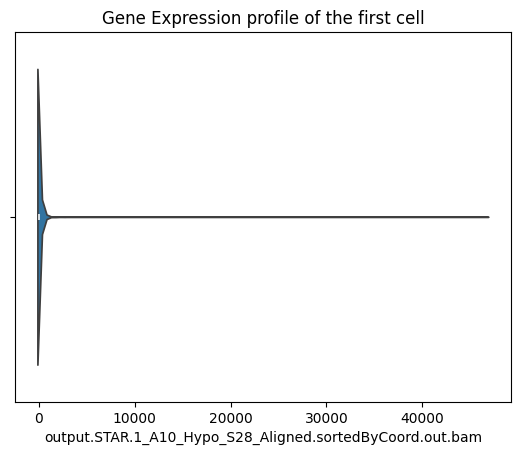

In [ ]:
sns.violinplot(x = smart_mcf_unfiltered.iloc[:, 0])
plt.title('Gene Expression profile of the first cell')
plt.show()

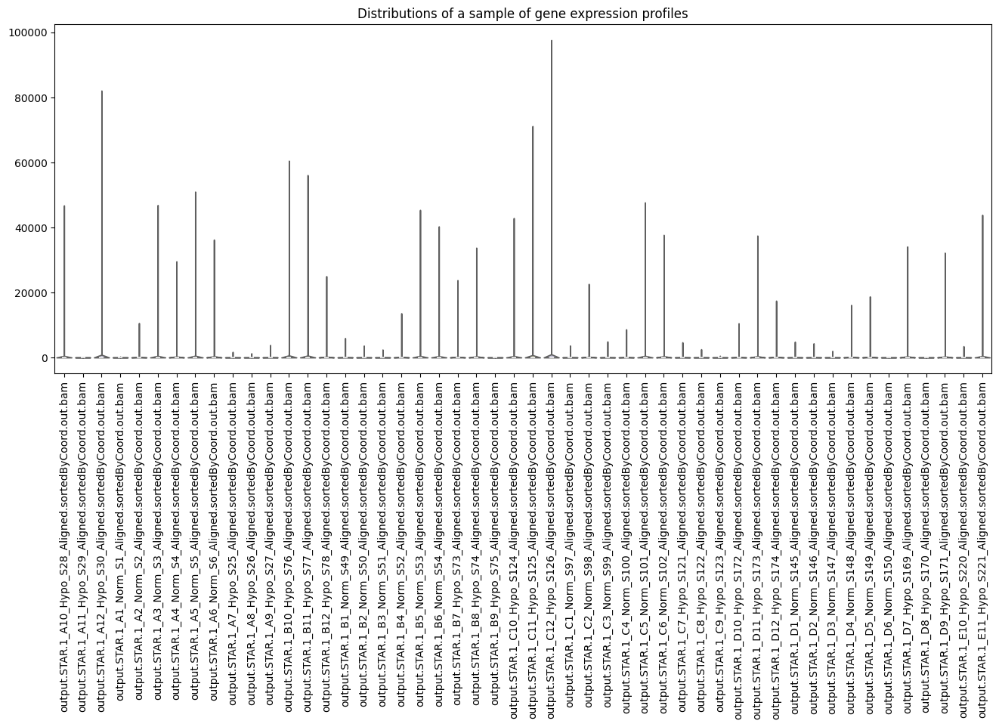

In [ ]:
df_reduced = smart_mcf_unfiltered.iloc[:, :50]
plt.figure(figsize = (16, 6))
sns.violinplot(data = df_reduced, palette = 'Set3', cut = 0)
plt.xticks(rotation = 90)
plt.title("Distributions of a sample of gene expression profiles")
plt.show()

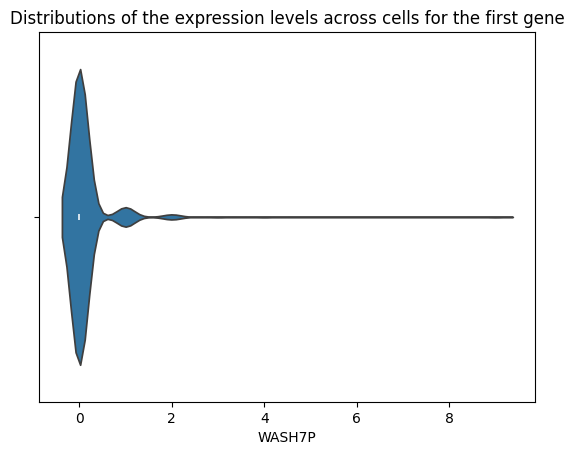

In [ ]:
sns.violinplot(x = smart_mcf_unfiltered.iloc[0, :])
plt.title('Distributions of the expression levels across cells for the first gene')
plt.show()

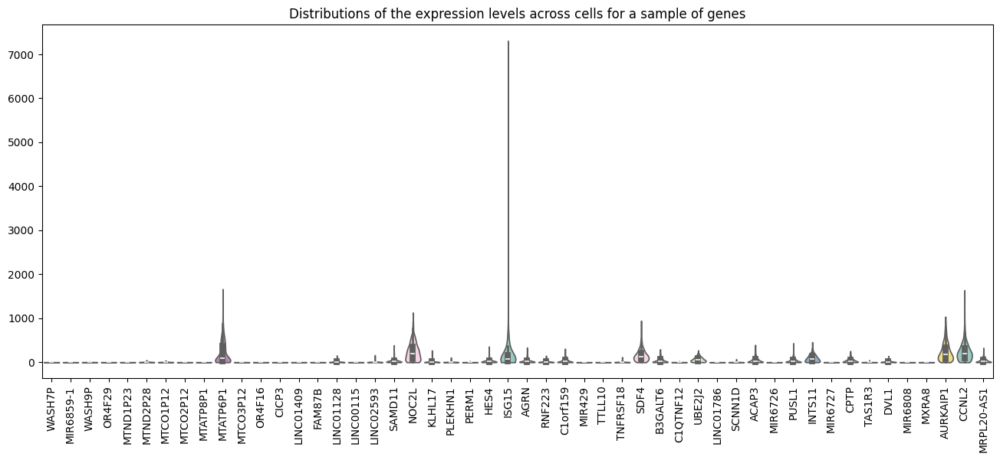

In [ ]:
df_reduced = smart_mcf_unfiltered.iloc[:50, :].T
plt.figure(figsize = (16, 6))
sns.violinplot(data = df_reduced, palette = 'Set3', cut = 0)
plt.xticks(rotation = 90)
plt.title("Distributions of the expression levels across cells for a sample of genes")
plt.show()

We notice that the data is sparse and that some reads are way bigger than others

## Skewness and kurtosis filtered vs unfiltered

In [ ]:
from scipy.stats import kurtosis, skew

In [ ]:
def plot_skewness(df):
  colN = np.shape(df)[1]

  cnames = list(df.columns)

  df_skew_cells = []

  for i in range(colN):
    df_skew_cells += [skew(df[cnames[i]])]

  df_skew_cells

  sns.histplot(df_skew_cells, bins = 100)
  plt.xlabel('Skewness of single cells expression profiles')

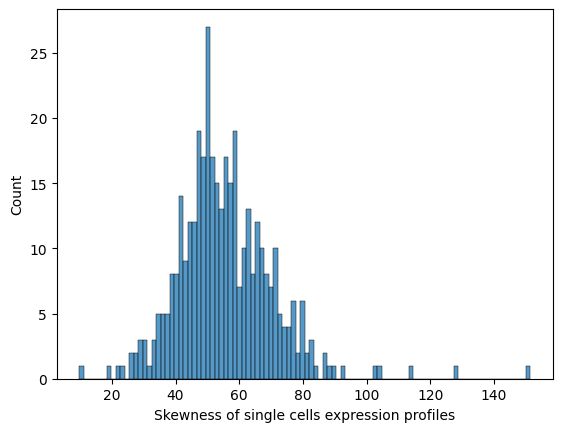

In [ ]:
plot_skewness(smart_mcf_unfiltered)

In [ ]:
def plot_kurtosis(df):
  colN = df.shape[1]


  cnames = list(df.columns)
  df_kurt_cells = []

  for i in range(colN):
    df_kurt_cells += [kurtosis(df[cnames[i]])]

  df_kurt_cells

  sns.histplot(df_kurt_cells, bins = 100)
  plt.xlabel('Kurtosis of single cells expression profiles')

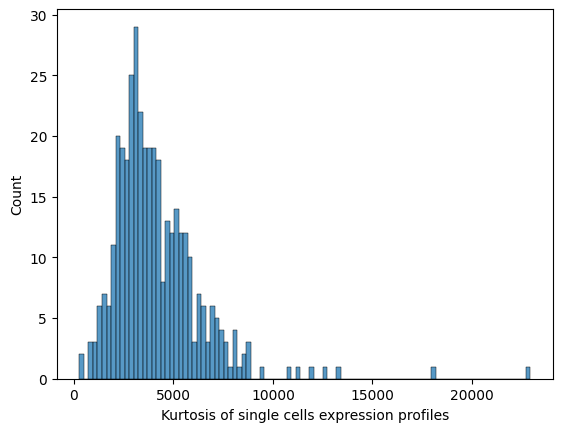

In [ ]:
plot_kurtosis(smart_mcf_unfiltered)

The distribution of unfiltered genes are highly non-normal, skewed and with heavy tails.

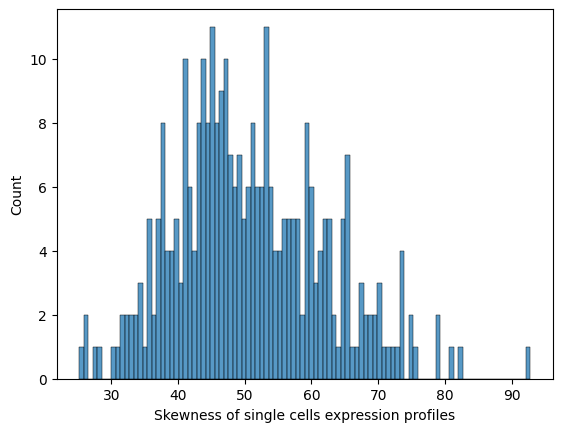

In [ ]:
plot_skewness(smart_mcf_filtered)

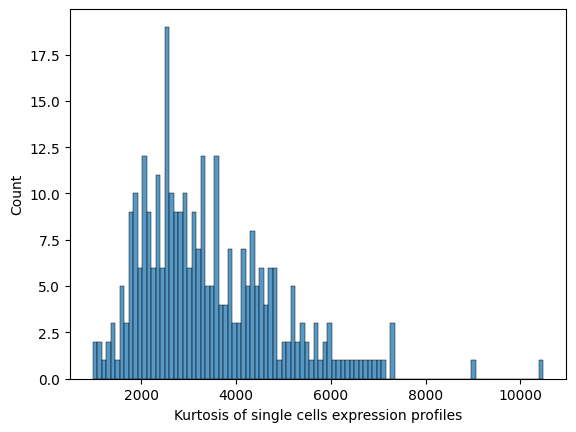

In [ ]:
plot_kurtosis(smart_mcf_filtered)

Kurtosis and skewness are not affected by the filtering

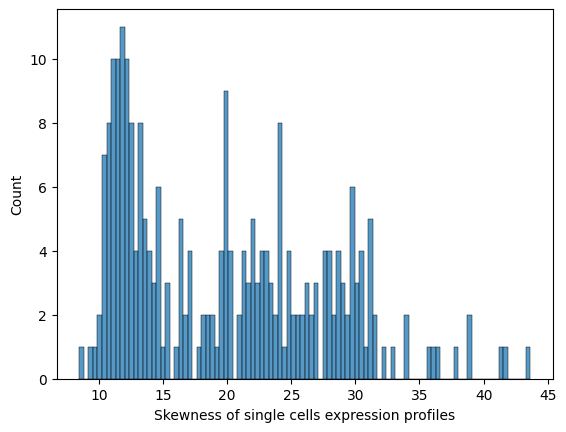

In [ ]:
plot_skewness(smart_mcf)

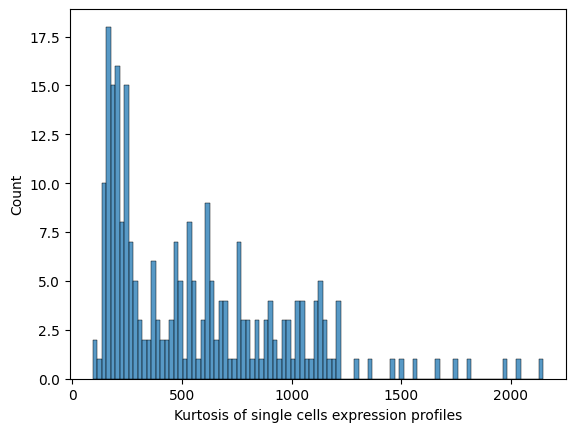

In [ ]:
plot_kurtosis(smart_mcf)

Normalization, even though effects skewness and kurtosis, does not make them vanish

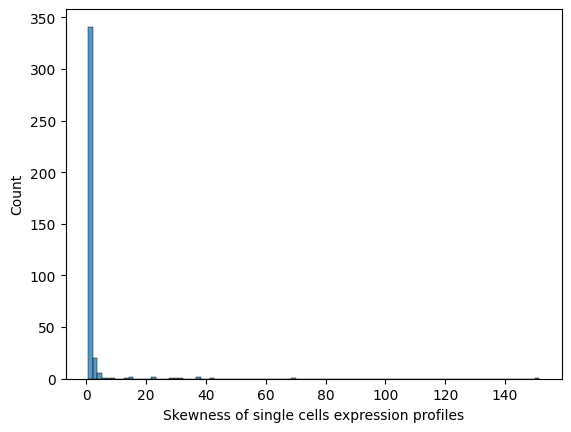

In [ ]:
plot_skewness(rescaling(smart_mcf_unfiltered))

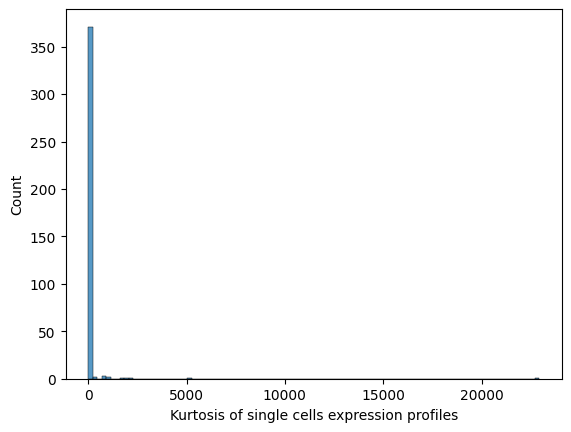

In [ ]:
plot_kurtosis(rescaling(smart_mcf_unfiltered))

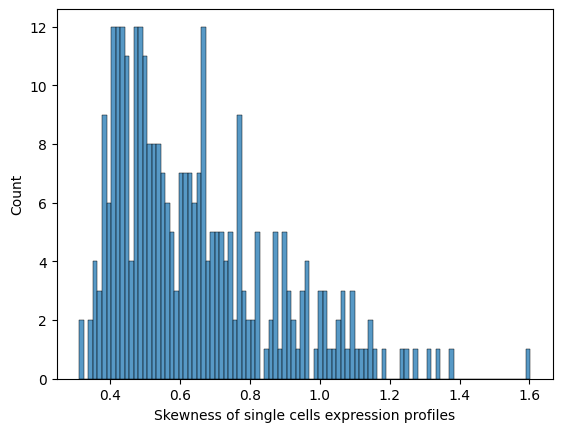

In [ ]:
plot_skewness(rescaling(smart_mcf_filtered))

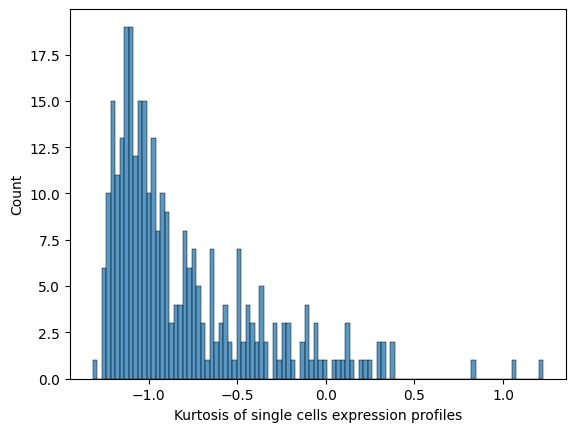

In [ ]:
plot_kurtosis(rescaling(smart_mcf_filtered))

Here the kurtosis is negative since it calculated centered at the kurtosis of the Gaussian, which is 3.

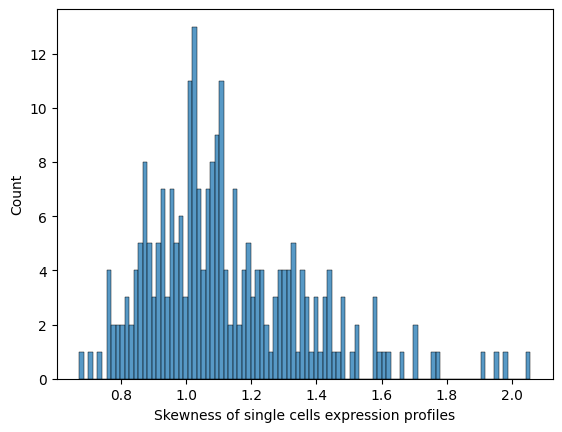

In [ ]:
plot_skewness(rescaling(smart_mcf))

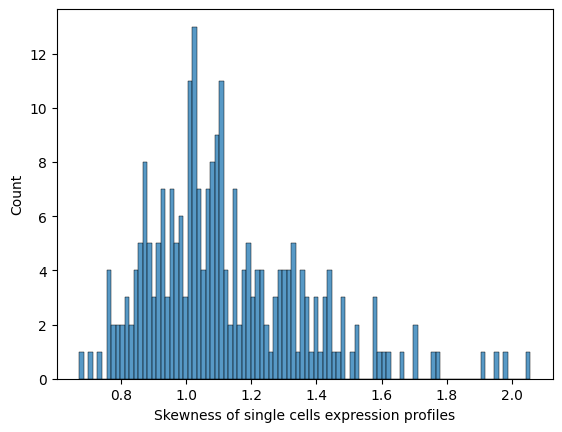

In [ ]:
plot_skewness(rescaling(smart_mcf))

We notice that the log2-rescaling of data succesfully makes skewness and kurtosis vanish.

## Normalization

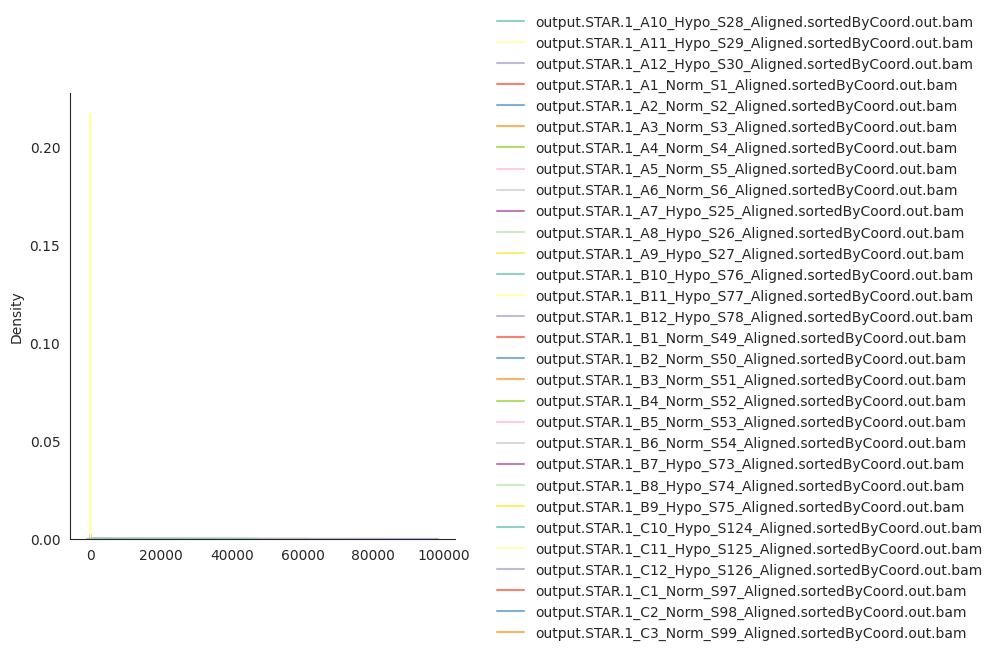

In [ ]:
sns.displot(data = smart_mcf_unfiltered.iloc[:, :30], palette = "Set3", kind = "kde", bw_adjust = 2)

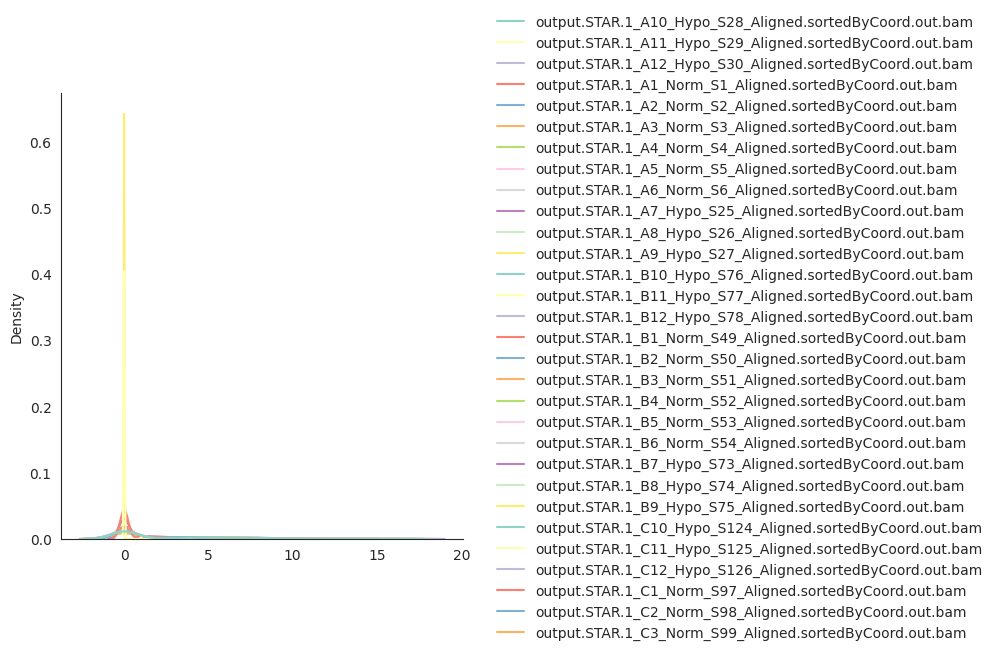

In [ ]:
sns.displot(data = rescaling(smart_mcf_unfiltered).iloc[:, :30], palette = "Set3", kind = "kde", bw_adjust = 2)

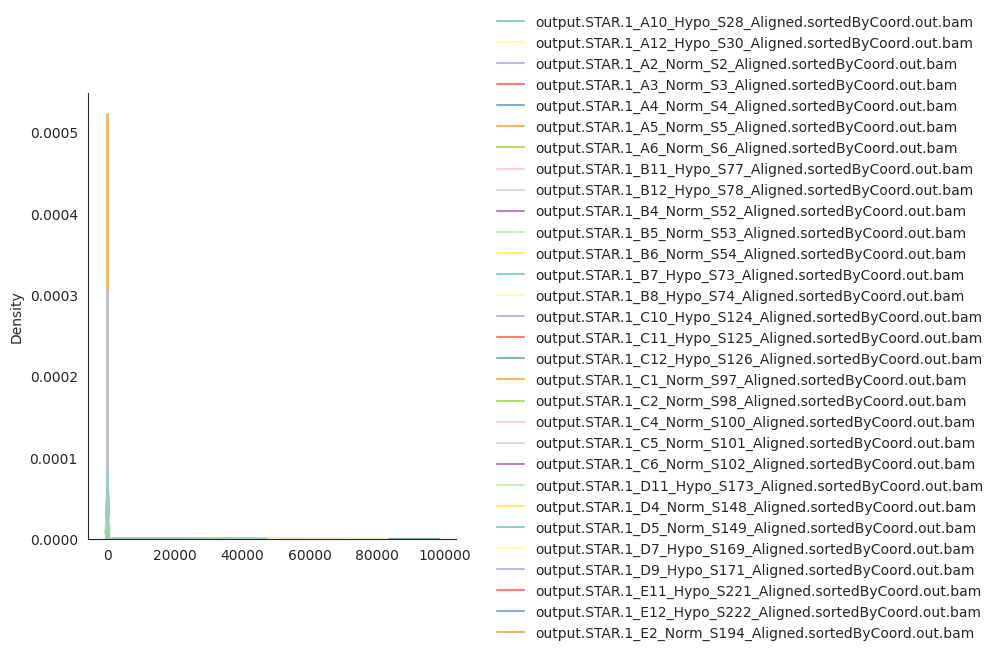

In [ ]:
sns.displot(data = smart_mcf_filtered.iloc[:, :30], palette = "Set3", kind = "kde", bw_adjust = 2)

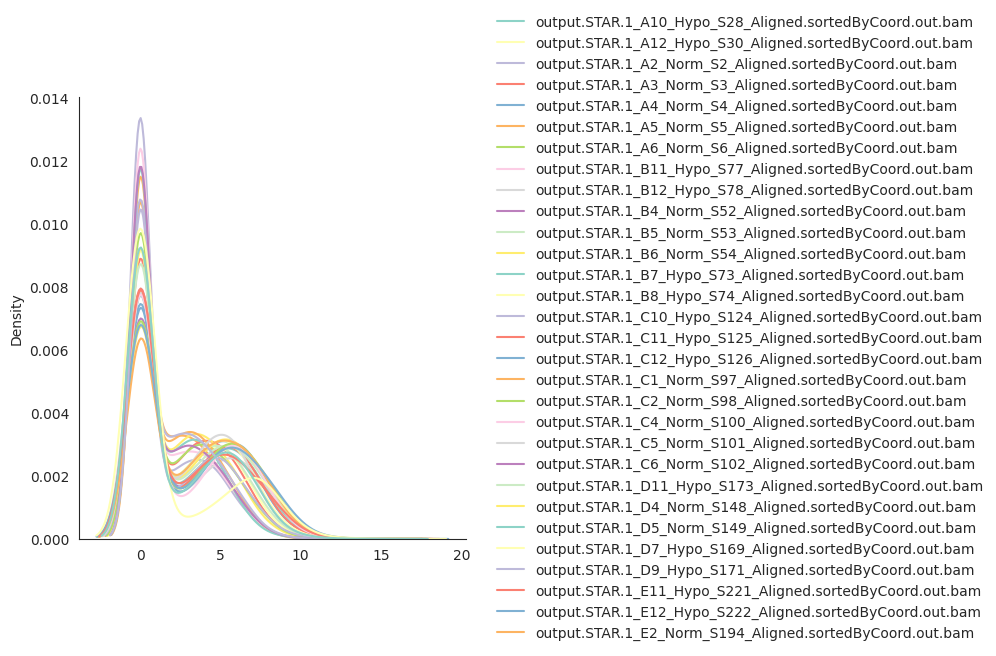

In [ ]:
sns.displot(data = rescaling(smart_mcf_filtered).iloc[:, :30], palette = "Set3", kind = "kde", bw_adjust = 2)

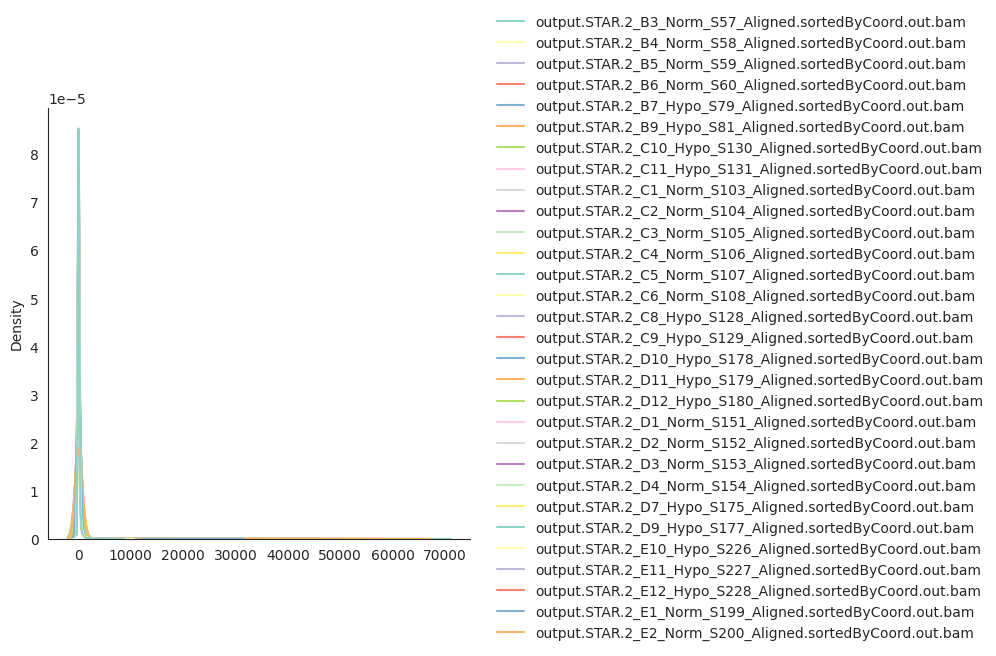

In [ ]:
sns.displot(data = smart_mcf.iloc[:, :30], palette = "Set3", kind = "kde", bw_adjust = 2)

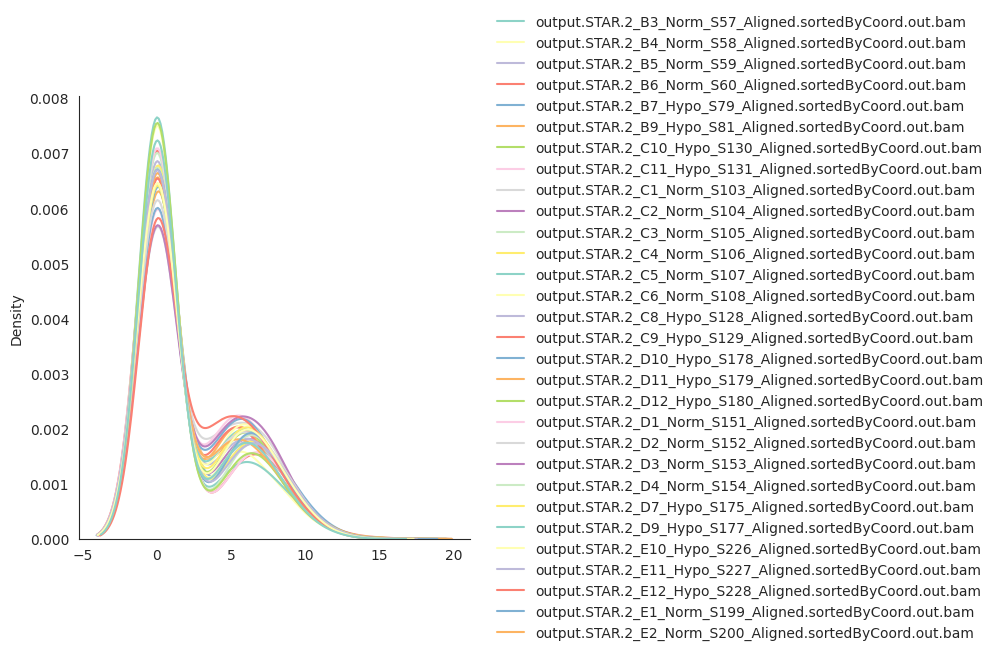

In [ ]:
sns.displot(data = rescaling(smart_mcf).iloc[:, :30], palette="Set3", kind="kde", bw_adjust=2)

While with normalization data still remains concentrated around a very spiking peak, log2-rescaling smoothens the distributions out more succesfully

## Mean - variance plots

In [ ]:
def mean_var_plot(df):
  sns.set_style("white")
  fig = plt.figure(figsize=(8, 5))

  variance=(np.log2(1 + df).var())
  mean = np.log2(1 + df).mean()
  plt.scatter(mean, variance, alpha=0.5, c="r", cmap='viridis')

  plt.xlabel("Mean")
  plt.ylabel("Variance")
  plt.title("Mean vs variance of genes - logged data", fontsize=15)

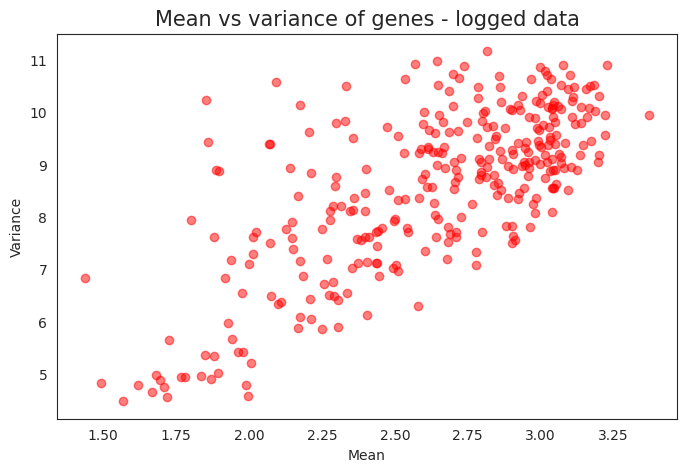

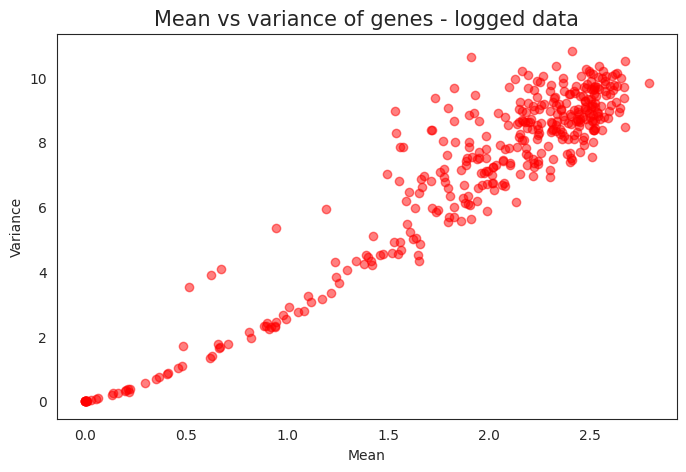

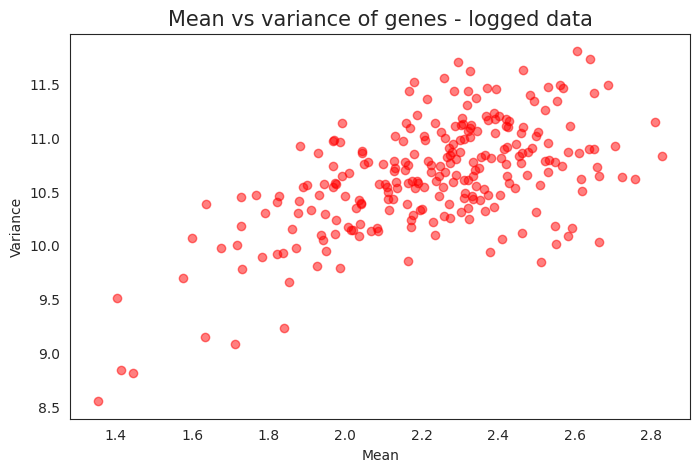

In [ ]:
mean_var_plot(smart_mcf_filtered)
mean_var_plot(smart_mcf_unfiltered)
mean_var_plot(smart_mcf)

In [ ]:
from sklearn.linear_model import LinearRegression

def mean_var_plot(df):
  sns.set_style("white")
  fig = plt.figure(figsize=(6, 4))

  variance=(np.log2(1 + df).var())
  mean = np.log2(1 + df).mean()

  x = mean.values.reshape(-1, 1)
  y = variance.values.reshape(-1, 1)

# Fit linear regression model
  model = LinearRegression()
  model.fit(x, y)

# Predict y values based on the linear regression model
  y_pred = model.predict(x)

  plt.scatter(mean, variance, alpha=0.5, c="b")

  plt.plot(mean, y_pred, color='red', label='Line of Best Fit')

  plt.xlabel("Mean")
  plt.ylabel("Variance")
  plt.title("Mean vs variance of genes - logged data", fontsize=15);

In [ ]:
# Calculate the percentage of zeros in each column
sparsity_unf_gene = (smart_mcf_unfiltered.T == 0).sum() / len(smart_mcf_unfiltered.T) * 100

sparsity_unf_gene.sort_values()

KRT8          1.305483
ACTB          1.566580
ALDOA         1.566580
KRT18         1.566580
GAPDH         1.566580
               ...    
PECAM1       99.477807
RPL23AP23    99.477807
RPL26P29     99.477807
BEND7P1      99.477807
SLIT3        99.477807
Length: 22934, dtype: float64

In [ ]:
dense_columns = sparsity_unf_gene[sparsity_unf_gene[:] <= 98.236]
filtered_df_gene = smart_mcf_unfiltered.T[dense_columns.index]

print("Filtered DataFrame shape:", filtered_df_gene.shape)
print("Unfiltered DataFrame shape:", smart_mcf_unfiltered.T.shape)
print("Given filtered DataFrame shape:", smart_mcf_filtered.T.shape)

Filtered DataFrame shape: (383, 18714)
Unfiltered DataFrame shape: (383, 22934)
Given filtered DataFrame shape: (313, 18945)


In [ ]:
df_smart_mcf_filtered_sp = filtered_df_gene.T
df_trans_sp = rescaling(df_smart_mcf_filtered_sp)

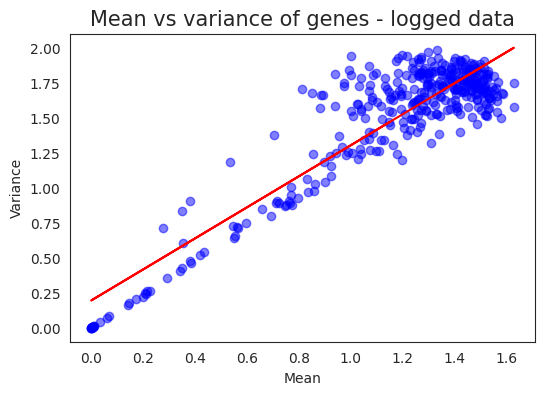

In [ ]:
mean_var_plot(df_trans_sp)

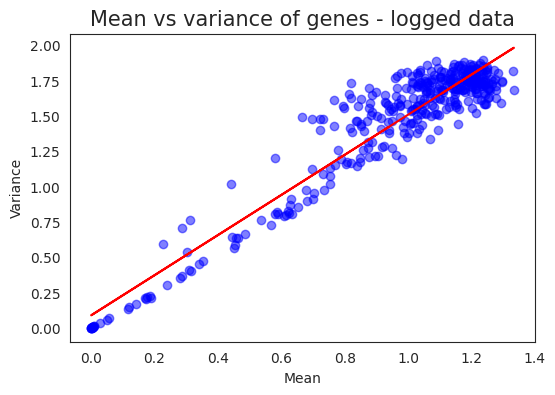

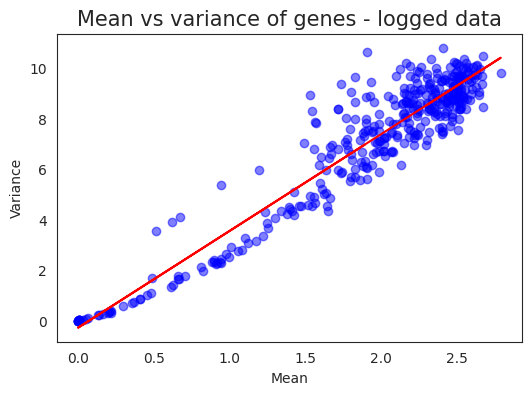

In [ ]:
mean_var_plot(rescaling(smart_mcf_unfiltered))
mean_var_plot(smart_mcf_unfiltered)

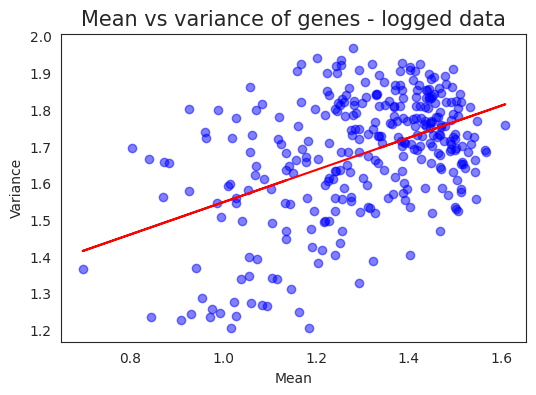

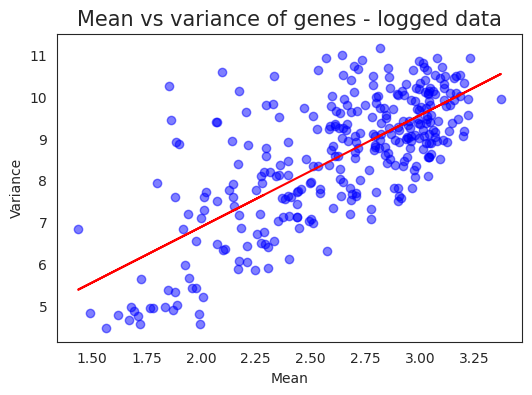

In [ ]:
mean_var_plot(rescaling(smart_mcf_filtered))
mean_var_plot(smart_mcf_filtered)

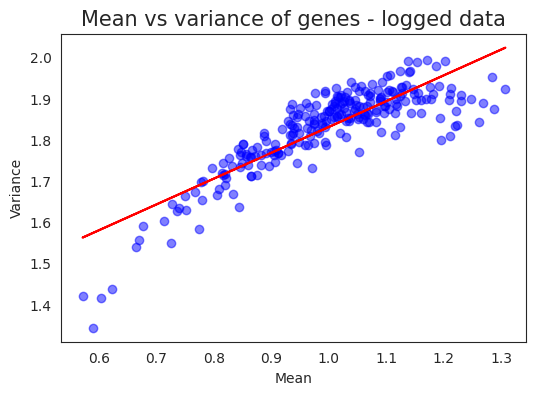

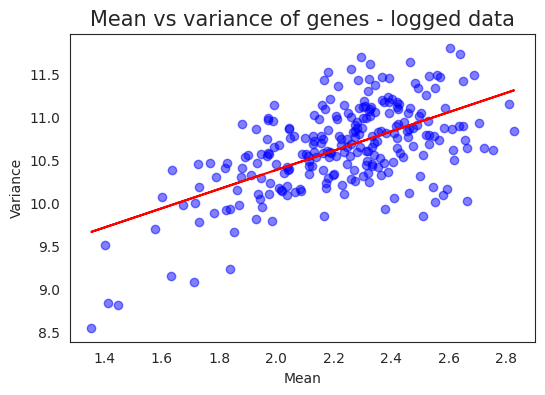

In [ ]:
mean_var_plot(rescaling(smart_mcf))
mean_var_plot(smart_mcf)

## Duplicate rows

In [ ]:
duplicate_rows_df = df_trans_sp[df_trans_sp.duplicated(keep=False)]
print("number of duplicate rows: ", duplicate_rows_df.shape)
print("number of duplicate rows: ", duplicate_rows_df)

number of duplicate rows:  (10, 383)
number of duplicate rows:                   output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam  \
UGT1A8                                                         0.0          
UGT1A9                                                         0.0          
PANDAR                                                         0.0          
LAP3P2                                                         0.0          
SUGT1P4-STRA6LP                                                0.0          
STRA6LP                                                        0.0          
LINC00856                                                      0.0          
LINC00595                                                      0.0          
CCL3L3                                                         0.0          
CCL3L1                                                         0.0          

                 output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam  \
UGT1A8     

In [ ]:
print("names of duplicate rows: ", duplicate_rows_df.index)
duplicate_rows_df_t = duplicate_rows_df.T
duplicate_rows_df_t
c_dupl = duplicate_rows_df_t.corr()
c_dupl

names of duplicate rows:  Index(['UGT1A8', 'UGT1A9', 'PANDAR', 'LAP3P2', 'SUGT1P4-STRA6LP', 'STRA6LP',
       'LINC00856', 'LINC00595', 'CCL3L3', 'CCL3L1'],
      dtype='object')


,UGT1A8,UGT1A9,PANDAR,LAP3P2,SUGT1P4-STRA6LP,STRA6LP,LINC00856,LINC00595,CCL3L3,CCL3L1
UGT1A8,1.000000,1.000000,0.001888,0.001888,0.094395,0.094395,-0.023056,-0.023056,-0.030130,-0.030130
UGT1A9,1.000000,1.000000,0.001888,0.001888,0.094395,0.094395,-0.023056,-0.023056,-0.030130,-0.030130
PANDAR,0.001888,0.001888,1.000000,1.000000,0.057092,0.057092,-0.034693,-0.034693,0.003298,0.003298
LAP3P2,0.001888,0.001888,1.000000,1.000000,0.057092,0.057092,-0.034693,-0.034693,0.003298,0.003298
SUGT1P4-STRA6LP,0.094395,0.094395,0.057092,0.057092,1.000000,1.000000,-0.053179,-0.053179,0.081243,0.081243
STRA6LP,0.094395,0.094395,0.057092,0.057092,1.000000,1.000000,-0.053179,-0.053179,0.081243,0.081243
LINC00856,-0.023056,-0.023056,-0.034693,-0.034693,-0.053179,-0.053179,1.000000,1.000000,-0.019943,-0.019943
LINC00595,-0.023056,-0.023056,-0.034693,-0.034693,-0.053179,-0.053179,1.000000,1.000000,-0.019943,-0.019943
CCL3L3,-0.030130,-0.030130,0.003298,0.003298,0.081243,0.081243,-0.019943,-0.019943,1.000000,1.000000
CCL3L1,-0.030130,-0.030130,0.003298,0.003298,0.081243,0.081243,-0.019943,-0.019943,1.000000,1.000000


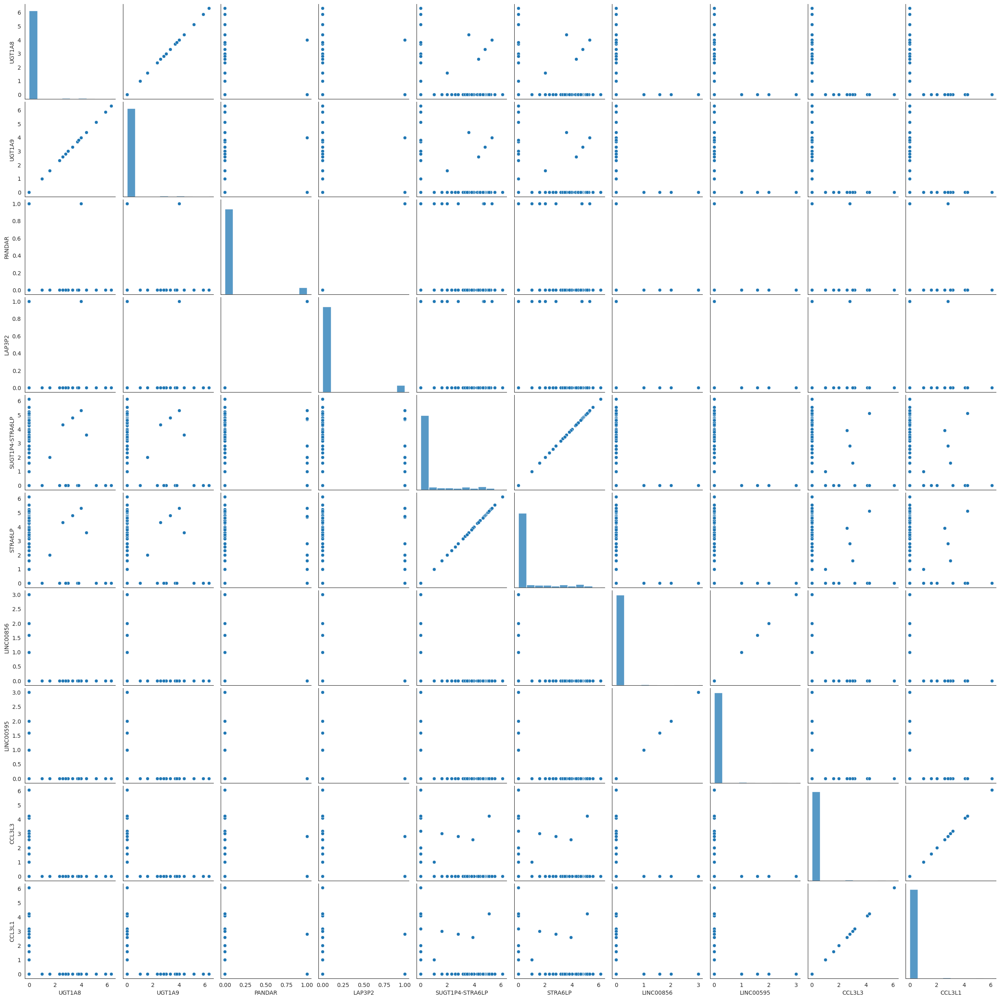

In [ ]:
sns.pairplot(duplicate_rows_df_t)

In [ ]:
duplicate_rows_df_t.describe()

,UGT1A8,UGT1A9,PANDAR,LAP3P2,SUGT1P4-STRA6LP,STRA6LP,LINC00856,LINC00595,CCL3L3,CCL3L1
count,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000
mean,0.137891,0.137891,0.073107,0.073107,0.586322,0.586322,0.032859,0.032859,0.093464,0.093464
std,0.739790,0.739790,0.260653,0.260653,1.363790,1.363790,0.266343,0.266343,0.579702,0.579702
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,6.303781,6.303781,1.000000,1.000000,6.129283,6.129283,3.000000,3.000000,6.066089,6.066089


In [ ]:
df_trans_sp.count()

output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    18714
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    18714
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    18714
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      18714
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      18714
                                                            ...  
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    18714
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    18714
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    18714
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    18714
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    18714
Length: 383, dtype: int64

In [ ]:
df_noDup = df_trans_sp.drop_duplicates()

In [ ]:
df_trans_sp.count()

output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    18714
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    18714
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    18714
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      18714
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      18714
                                                            ...  
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    18714
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    18714
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    18714
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    18714
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    18714
Length: 383, dtype: int64

## Data structure

Number of cells included:  (383, 383)
Average correlation of expression profiles between cells:  0.4952313892879932
Min. correlation of expression profiles between cells:  -0.009537221424013665


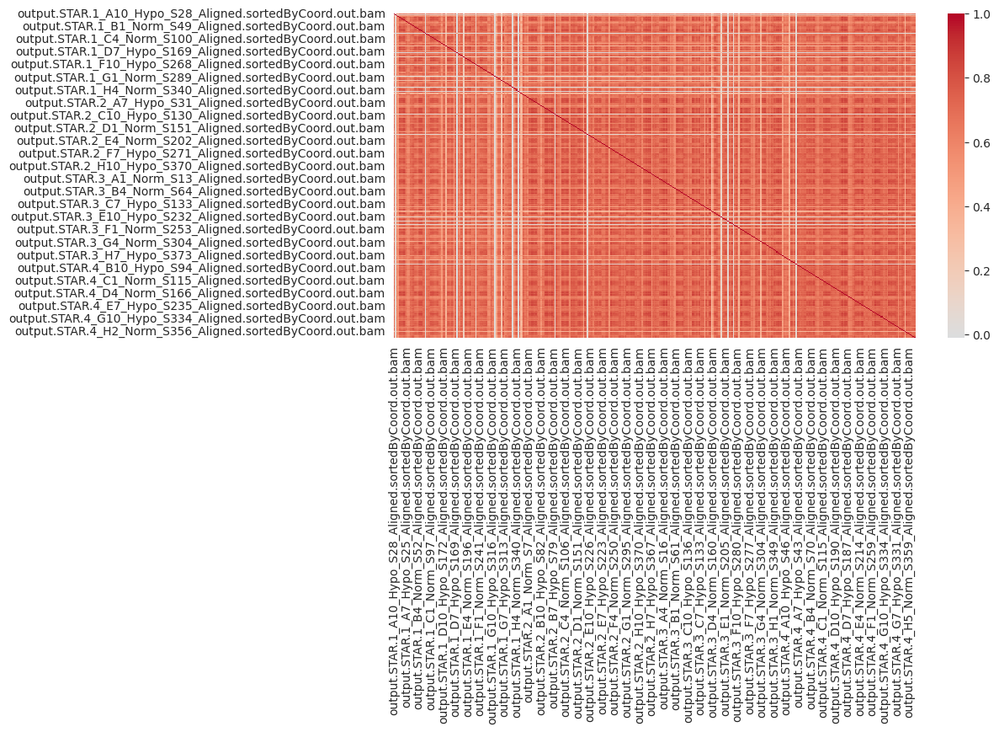

In [ ]:
plt.figure(figsize=(10,5))
#df_small = df.iloc[:, :50]
#c= df_small.corr()
c= df_trans_sp.corr()
midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(c,cmap='coolwarm', center=0 )
print("Number of cells included: ", np.shape(c))
print("Average correlation of expression profiles between cells: ", midpoint)
print("Min. correlation of expression profiles between cells: ", c.values.min())

In [ ]:
df_trans_sp = rescaling(df_smart_mcf_filtered_sp)

In [ ]:
df_small = df_trans_sp.iloc[:, 10:30]

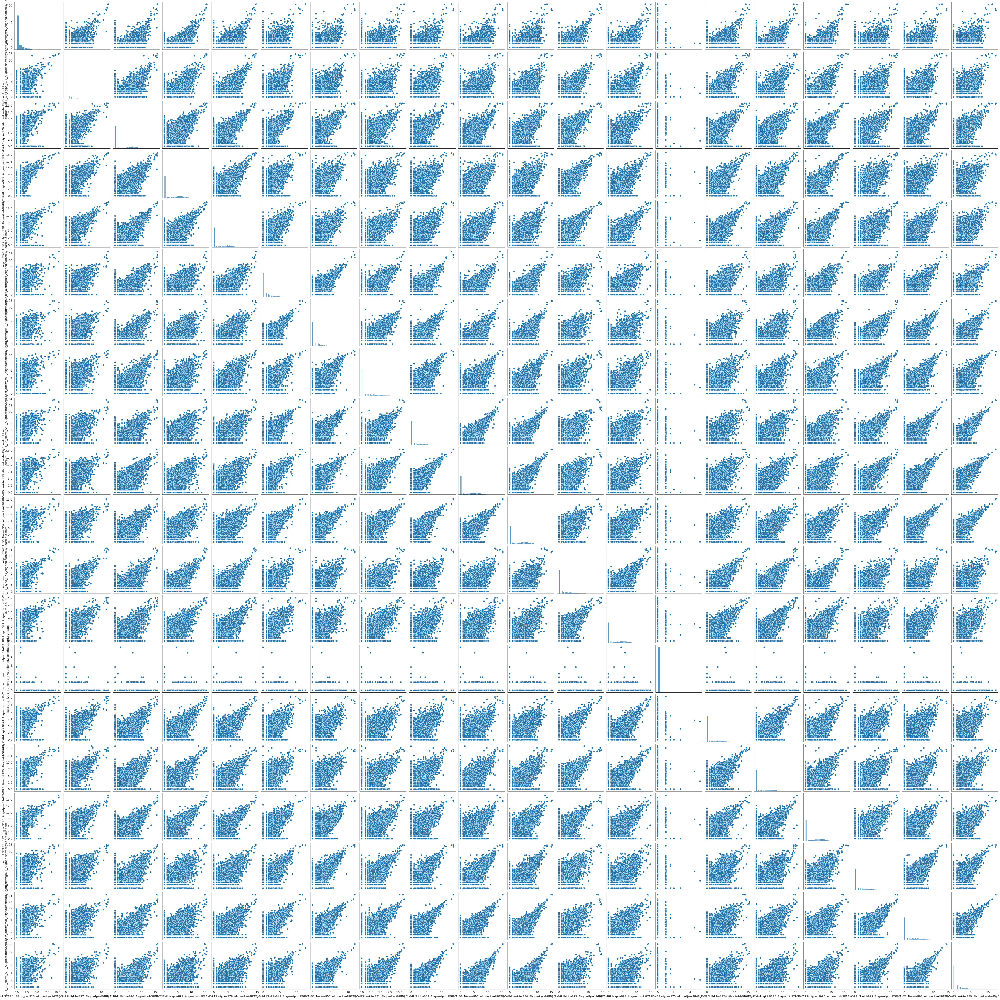

In [ ]:
sns.pairplot(df_small)

# UNSUPERVISED LEARNING


In this section we move on to exploring unsupervised learning techniques in order to visualize and cluster the data.

## Standard scaling

In [ ]:
#Transpose to analyze cells first
smart_mcf = smart_mcf.T
smart_hcc = smart_hcc.T
drop_mcf = drop_mcf.T
drop_hcc = drop_hcc.T

We apply StandardScaler in order to remove the mean and scale to unit variance

In [ ]:
#Normalization
sc = StandardScaler()

In [ ]:
smart_mcf.head()

,"""CYP1B1""","""CYP1B1-AS1""","""CYP1A1""","""NDRG1""","""DDIT4""","""PFKFB3""","""HK2""","""AREG""","""MYBL2""","""ADM""",...,"""CD27-AS1""","""DNAI7""","""MAFG""","""LZTR1""","""BCO2""","""GRIK5""","""SLC25A27""","""DENND5A""","""CDK5R1""","""FAM13A-AS1"""
"""output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam""",8.426265,7.139551,0.0,0.000000,8.596190,6.247928,0.000000,0.000000,8.897845,0.0,...,6.0,0.0,4.169925,5.906891,0.0,0.0,0.0,5.700440,0.0,0.0
"""output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam""",7.044394,5.906891,0.0,1.000000,8.179909,5.426265,0.000000,9.743151,10.632086,0.0,...,0.0,0.0,1.000000,4.700440,0.0,0.0,0.0,5.129283,0.0,0.0
"""output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam""",8.823367,7.672425,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,9.599913,0.0,...,4.0,0.0,4.584963,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
"""output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam""",4.807355,3.000000,0.0,0.000000,8.174926,7.748193,4.000000,7.924813,10.219169,0.0,...,1.0,0.0,2.000000,3.459432,0.0,0.0,0.0,2.321928,0.0,0.0
"""output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam""",12.506308,11.382624,0.0,9.355351,11.279030,10.647458,9.548822,8.771489,0.000000,0.0,...,0.0,0.0,6.000000,0.000000,0.0,0.0,0.0,5.930737,0.0,0.0


In [ ]:
drop_mcf.head()

,"""MALAT1""","""MT-RNR2""","""NEAT1""","""H1-5""","""TFF1""","""MT-RNR1""","""H4C3""","""GDF15""","""KRT81""","""MT-CO3""",...,"""MROH1""","""SKIDA1""","""MICALL1""","""RARG""","""MYO1F""","""BRWD1-AS2""","""RPS19BP1""","""AUNIP""","""TNK2""","""SUDS3"""
"""AAAAACCTATCG_Normoxia""",1.000000,0.000000,0.0,0.0,2.321928,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""AAAACAACCCTA_Normoxia""",2.000000,0.000000,0.0,0.0,1.000000,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""AAAACACTCTCA_Normoxia""",2.000000,0.000000,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""AAAACCAGGCAC_Normoxia""",2.807355,1.584963,0.0,0.0,1.000000,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""AAAACCTAGCTC_Normoxia""",2.321928,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
SM = sc.fit_transform(smart_mcf)
SH = sc.fit_transform(smart_hcc)
DM = sc.fit_transform(drop_mcf)
DH = sc.fit_transform(drop_hcc)

In [ ]:
dataframes = ["smart_mcf", "smart_hcc", "drop_mcf", "drop_hcc"]

In [ ]:
smart_mcf_index = smart_mcf.index
smart_hcc_index = smart_hcc.index
drop_mcf_index = drop_mcf.index
drop_hcc_index = drop_hcc.index

In [ ]:
del smart_mcf, smart_hcc, drop_mcf, drop_hcc

## PCA

We perform dimensionality reduction in order to visualize the data and for classification later on. The first method we use is PCA. In the following we plot how the explained variance grows with the number of principal components and also the variance explained by each component.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca1 = PCA(n_components = SM.shape[0])
pca2 = PCA(n_components = SH.shape[0])
pca3 = PCA(n_components = DM.shape[1])
pca4 = PCA(n_components = DH.shape[1])

In [ ]:
pcas = [pca1, pca2, pca3, pca4]

In [ ]:
pca1.fit(SM)
red1 = pca1.transform(SM)

pca2.fit(SH)
red2 = pca1.transform(SH)

pca3.fit(DM)
red3 = pca3.transform(DM)

pca4.fit(DH)
red4 = pca4.transform(DH)

In [ ]:
var_ratios = []
for pca in pcas:
  var_ratios.append(pca.explained_variance_ratio_) #percentage of variance explained by each of the selected components

In [ ]:
cumsum = []
for var in var_ratios:
  cumsum.append(np.cumsum(var)) #np.cumsum returns the array containing the cumulative sums of the input array

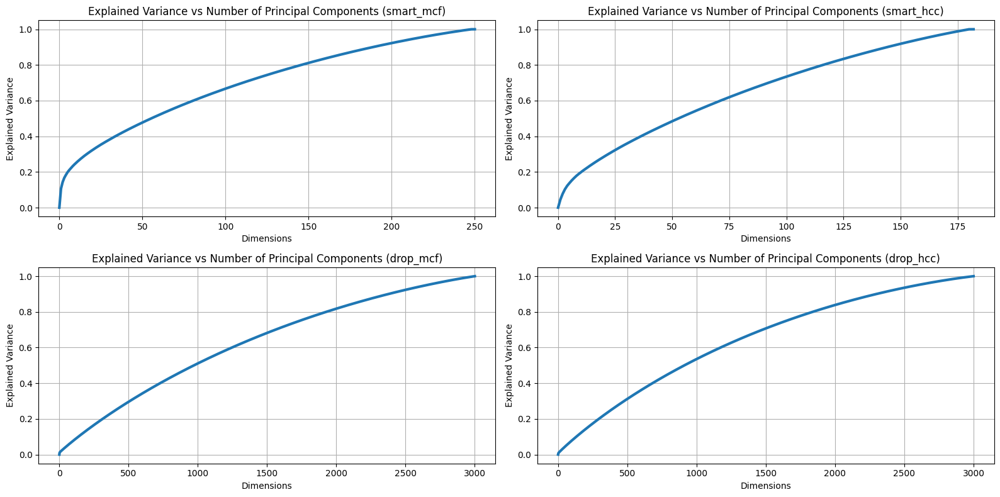

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(16, 8))

temp = np.array([0])
for i, (sum, df) in enumerate(zip(cumsum, dataframes)):
    t = np.append(temp, sum)
    plt.subplot(2, 2, i+1)
    plt.plot(t, linewidth=3)
    plt.xlabel("Dimensions")
    plt.ylabel("Explained Variance")
    plt.title(f"Explained Variance vs Number of Principal Components ({df})")
    plt.grid(True)


plt.tight_layout()
plt.show()

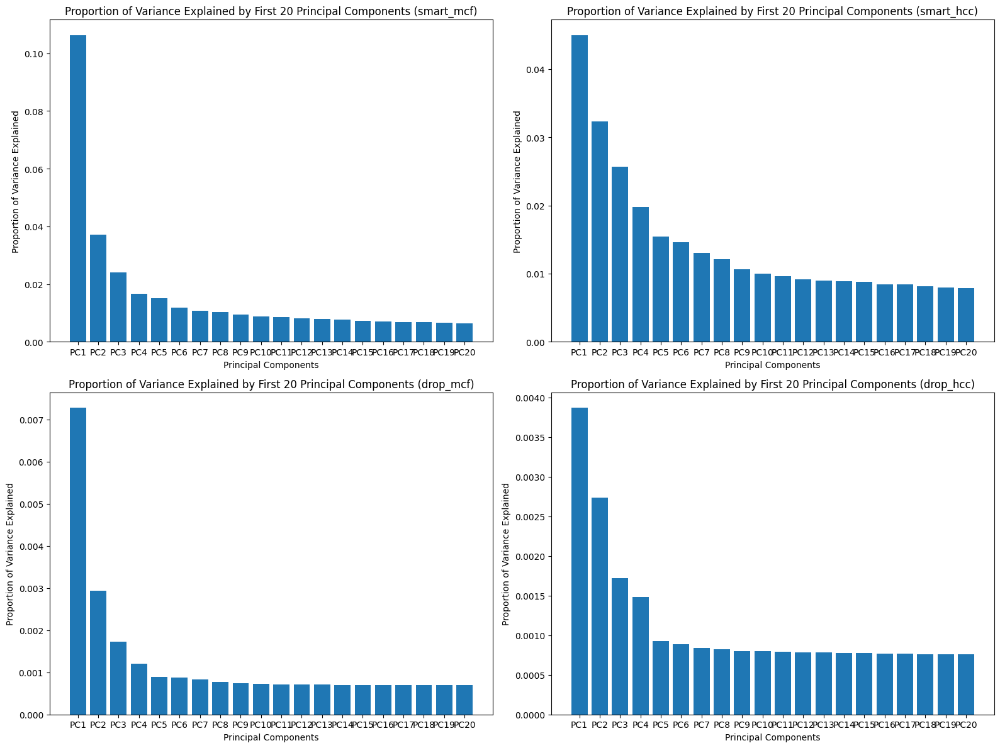

In [ ]:
plt.figure(figsize=(16, 12))

for i, (var, df) in enumerate(zip(var_ratios, dataframes)):
    labels = ["PC"+str(i+1) for i in range(20)]
    plt.subplot(2, 2, i+1)
    plt.bar(labels, var[0:20])
    plt.xlabel('Principal Components')
    plt.ylabel('Proportion of Variance Explained')
    plt.title(f'Proportion of Variance Explained by First 20 Principal Components ({df})')

plt.tight_layout()
plt.show()

Looking for example at smart_mcf, an elbow is not clearly visible in the cumulative explained variance plot and since already after the fifth pc the increase in explained variance is almost constant (histogram flattening out), we decide to select 95% explained variance. This is also noticeable in drop_mcf and drop_hcc.

In [ ]:
pca = PCA(n_components=0.95)

In [ ]:
pca.fit(SM)
red_smcf = pca.transform(SM) #pca-reduced dataset

pca.fit(SH)
red_shcc = pca.transform(SH)

pca.fit(DM)
red_dmcf = pca.transform(DM)

pca.fit(DH)
red_dhcc = pca.transform(DH)

In [ ]:
red_smcf.shape

(250, 215)

Now that we have the pca-reduced data we can visualize it in 3 dimensions.

In [ ]:
h_smcf = np.array(['Hypo' in name for name in smart_mcf_index])
n_smcf = np.array(['Norm' in name for name in smart_mcf_index])

h_shcc = np.array(['Hypo' in name for name in smart_hcc_index])
n_shcc = np.array(['Norm' in name for name in smart_hcc_index])

h_dmcf = np.array(['Hypo' in name for name in drop_mcf_index])
n_dmcf = np.array(['Norm' in name for name in drop_mcf_index])

h_dhcc = np.array(['Hypo' in name for name in drop_hcc_index])
n_dhcc = np.array(['Norm' in name for name in drop_hcc_index])

In [ ]:
hypo1 = red_smcf[(h_smcf == True), :3]
normo1 = red_smcf[(h_smcf == False), :3]

hypo2 = red_shcc[(h_shcc == True), :3]
normo2 = red_shcc[(h_shcc == False), :3]

hypo3 = red_dmcf[(h_dmcf == True), :3]
normo3 = red_dmcf[(h_dmcf == False), :3]

hypo4 = red_dhcc[(h_dhcc == True), :3]
normo4 = red_dhcc[(h_dhcc == False), :3]

In [ ]:
hypo1.shape

(124, 3)

In [ ]:
normo1.shape

(126, 3)

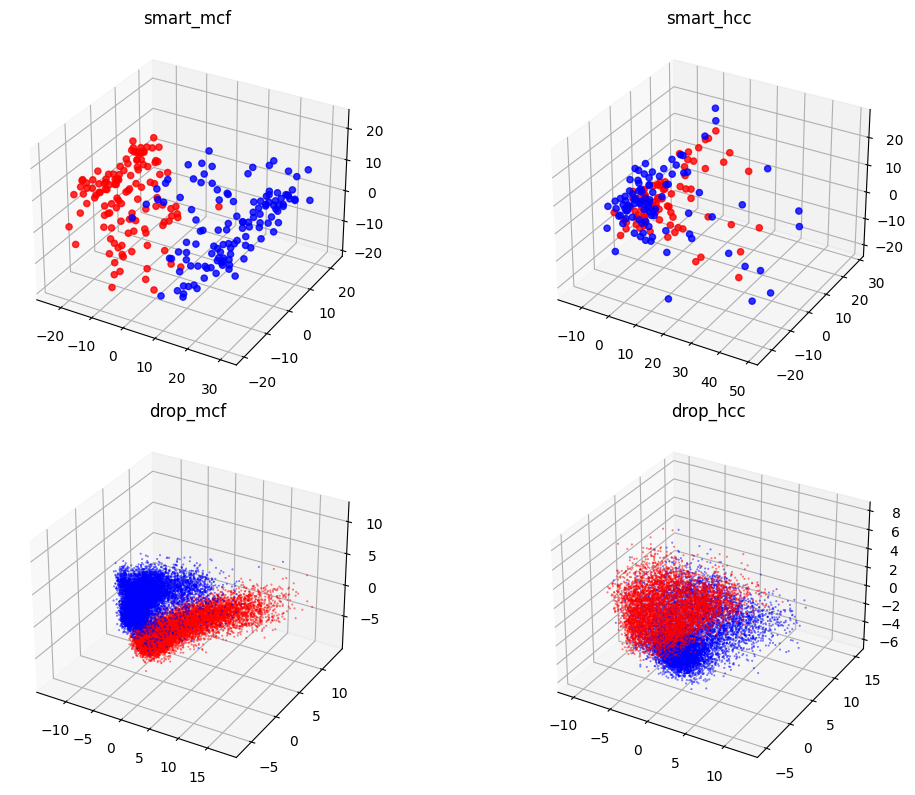

In [ ]:
fig = plt.figure(figsize=(12, 8))

data = [
    (hypo1, normo1, "smart_mcf"),
    (hypo2, normo2, "smart_hcc"),
    (hypo3, normo3, "drop_mcf"),
    (hypo4, normo4, "drop_hcc")
]

for i, (h_data, n_data, df_name) in enumerate(data, start=1):
  if i<=2:
    ax = fig.add_subplot(2, 2, i, projection='3d')
    ax.scatter(h_data[:, 0], h_data[:, 1], h_data[:, 2], color='blue', alpha=0.8)
    ax.scatter(n_data[:, 0], n_data[:, 1], n_data[:, 2], color='red', alpha=0.8)
    ax.set_title(df_name)
  else:
    ax = fig.add_subplot(2, 2, i, projection='3d')
    ax.scatter(h_data[::1, 0], h_data[::1, 1], h_data[::1, 2], color='blue', alpha=0.6, s=0.2)
    ax.scatter(n_data[::1, 0], n_data[::1, 1], n_data[::1, 2], color='red', alpha=0.6, s=0.2)
    ax.set_title(df_name)

plt.tight_layout()
plt.show()

In mcf a modest division is already visible. Nonetheless, let us try some other techniques and compare the results.

In [ ]:
del pca, pca1, pca2, pca3, pca4

## t-SNE

Stands for T-distributed Stochastic Neighbor Embedding. Differently from pca it is a nonlinear dimensionality reduction technique, whose purpose is to embed high-dimensional data into a lower dimensional space (in our case 2 dimensions, since the quadratic time complexity does not allow us to produce a transformation for the dropseq dataset (~22000 datapoints) in a reasonable amount of time). The underlying optimization problem consists in minimizing the KL-divergence between a probability distribution on the original space (built in such a a way that similar points are assigned a higher probability) and a corresponding probability distribution in the lower dimensional space (also built similarly). Ideally, similar points should remain close in the lower-dimensional representation, so that the local structure of the data is preserved.

In [ ]:
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD

We first compress tha data to 50 features using TruncatedSVD. The choice of this over other methods is motivated by the sparsity of the data.

In [ ]:
svd = TruncatedSVD(n_components = 50)

In [ ]:
svd.fit(SM)
svd1 = svd.transform(SM)
svd.fit(SH)
svd2 = svd.transform(SH)
svd.fit(DM)
svd3 = svd.transform(DM)
svd.fit(DH)
svd4 = svd.transform(DH)

In [ ]:
tsne = TSNE(n_components=2, init='random', random_state=11) #we set a random state to obtain the same result at each run

In [ ]:
red_tsne1 = tsne.fit_transform(svd1)
red_tsne2 = tsne.fit_transform(svd2)
red_tsne3 = tsne.fit_transform(svd3)
red_tsne4 = tsne.fit_transform(svd4)

In [ ]:
#we create a dataframe out of every array previously obtained
df_tsne1 = pd.DataFrame(red_tsne1, index = smart_mcf.index, columns=[f'T{i+1}'for i in range(2)])
df_tsne2 = pd.DataFrame(red_tsne2, index = smart_hcc.index, columns=[f'T{i+1}'for i in range(2)])
df_tsne3 = pd.DataFrame(red_tsne3, index = drop_mcf.index, columns=[f'T{i+1}'for i in range(2)])
df_tsne4 = pd.DataFrame(red_tsne4, index = drop_hcc.index, columns=[f'T{i+1}'for i in range(2)])

In [ ]:
df_tsne1.head()

,T1,T2
"""output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam""",18.513426,-4.126598
"""output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam""",9.536556,-2.661139
"""output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam""",15.905712,-1.740236
"""output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam""",8.694180,-3.482322
"""output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam""",-9.083183,2.792667


In [ ]:
#filter the dataframes using the masks
tsne_hypo1 = df_tsne1[h_smcf].iloc[:, :2]
tsne_normo1 = df_tsne1[n_smcf].iloc[:, :2]

tsne_hypo2 = df_tsne2[h_shcc].iloc[:, :2]
tsne_normo2 = df_tsne2[n_shcc].iloc[:, :2]

tsne_hypo3 = df_tsne3[h_dmcf].iloc[:, :2]
tsne_normo3 = df_tsne3[n_dmcf].iloc[:, :2]

tsne_hypo4 = df_tsne4[h_dhcc].iloc[:, :2]
tsne_normo4 = df_tsne4[n_dhcc].iloc[:, :2]

In [ ]:
tsne_hypo1.head()

,T1,T2
"""output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam""",-9.083183,2.792667
"""output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam""",-13.334299,1.323797
"""output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam""",-13.533349,-0.311500
"""output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam""",-15.967816,3.146890
"""output.STAR.2_C8_Hypo_S128_Aligned.sortedByCoord.out.bam""",-6.313376,-0.640608


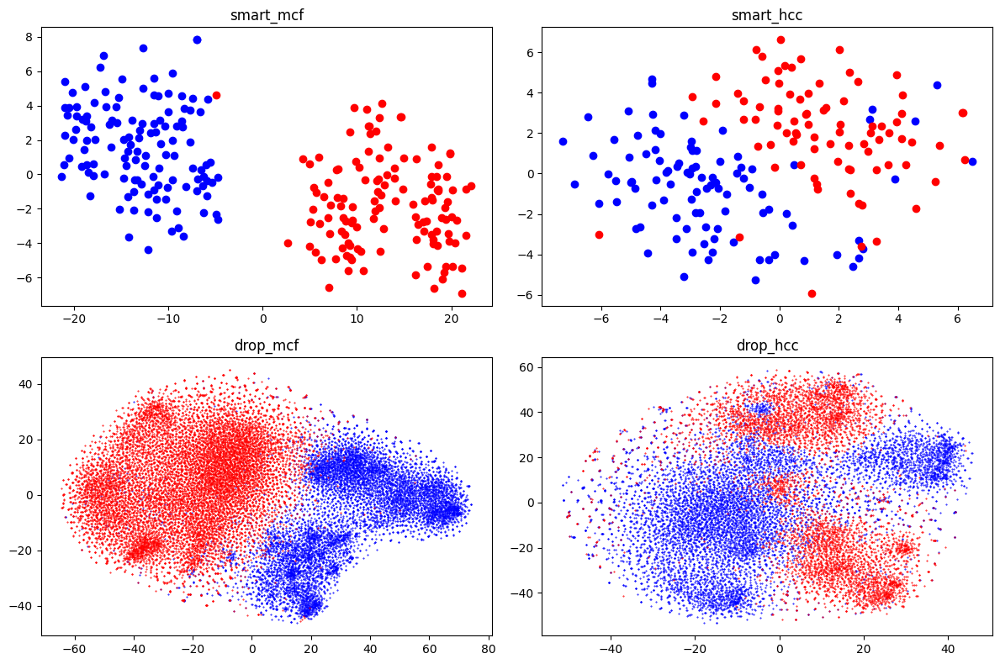

In [ ]:
fig = plt.figure(figsize=(12, 8))

data = [
    (tsne_hypo1, tsne_normo1, "smart_mcf"),
    (tsne_hypo2, tsne_normo2, "smart_hcc"),
    (tsne_hypo3, tsne_normo3, "drop_mcf"),
    (tsne_hypo4, tsne_normo4, "drop_hcc")
]

for i, (h_data, n_data, df_name) in enumerate(data, start=1):
    if i<=2:
      ax = fig.add_subplot(2, 2, i)
      ax.scatter(h_data.iloc[:, 0], h_data.iloc[:, 1], color='blue')
      ax.scatter(n_data.iloc[:, 0], n_data.iloc[:, 1], color='red')
      ax.set_title(df_name)
    else:
      ax = fig.add_subplot(2, 2, i)
      ax.scatter(h_data.iloc[::1, 0], h_data.iloc[::1, 1], color='blue', alpha=1, s=0.2)
      ax.scatter(n_data.iloc[::1, 0], n_data.iloc[::1, 1], color='red', alpha=1, s=0.2)
      ax.set_title(df_name)
plt.tight_layout()
plt.show()

One should keep in mind that tSNE performs a nonlinear transformation to the data, contrary to PCA, so what the axes actually represent is not easy to interpret. Nonetheless, these plots give us a feel of how the data looks like.

## UMAP

Stands for Uniform Manifold
Approximation and Projection. It is a dimensionality reduction technique based on manifold learning and topological data analysis. It relies on the crucial assumption that the data is uniformly distributed on a (Riemannian) manifold which the algorithm tries to approximate. We adopt it as an alternative to tSNE.

In [ ]:
#!pip install umap-learn

In [ ]:
import umap

In [ ]:
um = umap.UMAP(n_components = 3)

In [ ]:
red_umap_smcf = um.fit_transform(SM)
red_umap_shcc = um.fit_transform(SH)
red_umap_dmcf = um.fit_transform(DM)
red_umap_dhcc = um.fit_transform(DH)

In [ ]:
df_umap_smcf = pd.DataFrame(red_umap_smcf, index = smart_mcf_index,
                            columns=[f'C{i+1}'for i in range(red_umap_smcf.shape[1])])
df_umap_shcc = pd.DataFrame(red_umap_shcc, index = smart_hcc_index,
                            columns=[f'C{i+1}'for i in range(red_umap_shcc.shape[1])])
df_umap_dmcf = pd.DataFrame(red_umap_dmcf, index = drop_mcf_index,
                            columns=[f'C{i+1}'for i in range(red_umap_dmcf.shape[1])])
df_umap_dhcc = pd.DataFrame(red_umap_dhcc, index = drop_hcc_index,
                            columns=[f'C{i+1}'for i in range(red_umap_dhcc.shape[1])])


In [ ]:
umap_hypo1 = df_umap_smcf[h_smcf].iloc[:, :2]
umap_normo1 = df_umap_smcf[n_smcf].iloc[:, :2]

umap_hypo2 = df_umap_shcc[h_shcc].iloc[:, :2]
umap_normo2 = df_umap_shcc[n_shcc].iloc[:, :2]

umap_hypo3 = df_umap_dmcf[h_dmcf].iloc[:, :2]
umap_normo3 = df_umap_dmcf[n_dmcf].iloc[:, :2]

umap_hypo4 = df_umap_dhcc[h_dhcc].iloc[:, :2]
umap_normo4 = df_umap_dhcc[n_dhcc].iloc[:, :2]

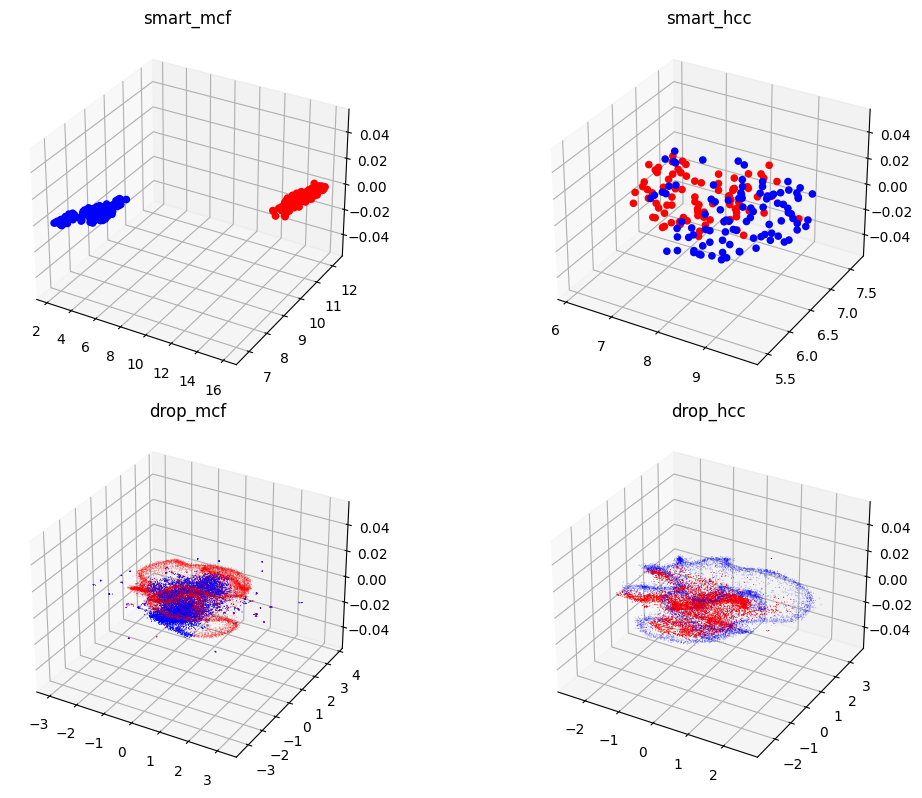

In [ ]:
fig = plt.figure(figsize=(12, 8))

data = [
    (umap_hypo1, umap_normo1, "smart_mcf"),
    (umap_hypo2, umap_normo2, "smart_hcc"),
    (umap_hypo3, umap_normo3, "drop_mcf"),
    (umap_hypo4, umap_normo4, "drop_hcc")
]

for i, (h_data, n_data, df_name) in enumerate(data, start=1):
  if i<=2:
    ax = fig.add_subplot(2, 2, i, projection = '3d')
    ax.scatter(h_data.iloc[:, 0], h_data.iloc[:, 1], color='blue', alpha = 1)
    ax.scatter(n_data.iloc[:, 0], n_data.iloc[:, 1], color='red', alpha = 1)
    ax.set_title(df_name)
  if i==3:
    ax = fig.add_subplot(2, 2, i, projection = '3d')
    ax.scatter(h_data.iloc[:, 0], h_data.iloc[:, 1], color='blue', alpha = 1, s=0.2, lw=0.25)
    ax.scatter(n_data.iloc[:, 0], n_data.iloc[:, 1], color='red', alpha = 0.25, s=0.2, lw=0.25)
    ax.set_title(df_name)
  if i==4:
    ax = fig.add_subplot(2, 2, i, projection = '3d')
    ax.scatter(h_data.iloc[:, 0], h_data.iloc[:, 1], color='blue', alpha = 0.25, s=0.2, lw=0.25)
    ax.scatter(n_data.iloc[:, 0], n_data.iloc[:, 1], color='red', alpha = 1, s=0.2, lw=0.25)
    ax.set_title(df_name)

plt.tight_layout()
plt.show()

While a strong separation can be noticed in smart_mcf, the same cannot be said about the others. This is confirmed also in the plots above.

In [ ]:
del DH, DM, SH, SM, df_umap_dhcc, df_umap_dmcf, df_umap_shcc, df_umap_smcf, drop_hcc_index, drop_mcf_index, h_data, hypo1, hypo2, hypo3, hypo4, normo1, normo2, normo3, normo4

In [ ]:
del umap_hypo1, umap_hypo2, umap_hypo3, umap_hypo4, umap_normo1, umap_normo2, umap_normo3, umap_normo4

In [ ]:
del red1, red2, red3, red4, n_data, n_dhcc, n_dmcf, n_shcc, n_smcf, pcas, red_umap_dhcc, red_umap_dmcf, red_umap_shcc, red_umap_smcf

## K-means

In a vanilla setting (without additional information), one should check for an optimal K in order to perform K-means. However, we already know that the cells are to be clustered into 2 groups (namely, hypoxia and normoxia). Thus, we assume that K = 2 is "optimal" for the scope of our analysis.

In [ ]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
def kmeans_plot(df, a, alg="lloyd"):
    #lloyd kmeans repeatedly finds the centroid of each set in the partition and then re-partitions the inputs accordingly

    kmeans = KMeans(n_clusters = 2, random_state = 0, n_init = 100, algorithm = alg)
    #n_init is the number of times the k-means algorithm is run with different centroid seeds
    # We select a high value since this is recommended for sparse high-dimensional data
    kmeans.fit(df)
    cluster_labels = kmeans.labels_ #labels for each datapoint

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    ax1.scatter(df[:, 0], df[:, 1], c=cluster_labels, cmap='viridis', alpha=a)
    ax1.set_xlabel('Principal Component 1')
    ax1.set_ylabel('Principal Component 2')
    ax1.set_title('K-means Clustering in 2D')


    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(df[:, 0], df[:, 1], df[:, 2], c=cluster_labels, cmap='viridis', alpha=a)
    ax2.set_xlabel('Principal Component 1')
    ax2.set_ylabel('Principal Component 2')
    ax2.set_zlabel('Principal Component 3')
    ax2.set_title('K-means Clustering in 3D')

    plt.show()
    return cluster_labels

In [ ]:
#this function computes the number of hypoxic and normoxic cells in the two clusters
def check(l, hypo):
    norm_0, hypo_0, norm_1, hypo_1 = 0,0,0,0
    for i, cond in zip(l, hypo):
      if cond == True and i==0:
        hypo_0 += 1
      elif cond == True and i==1:
        hypo_1 += 1
      elif cond == False and i==0:
        norm_0 += 1
      elif cond == False and i==1:
        norm_1 += 1

    return norm_0, hypo_0, norm_1, hypo_1

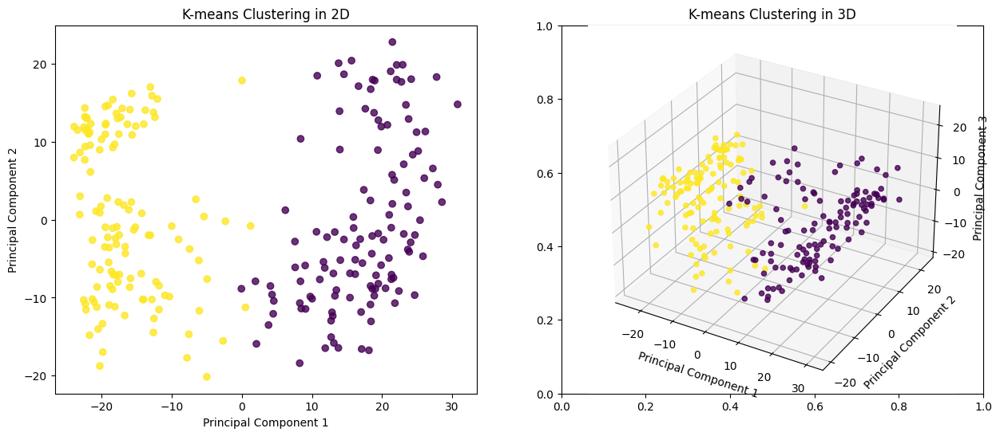

(0, 123, 126, 1)


In [ ]:
l = kmeans_plot(red_smcf, 0.8)
print(check(l, h_smcf))

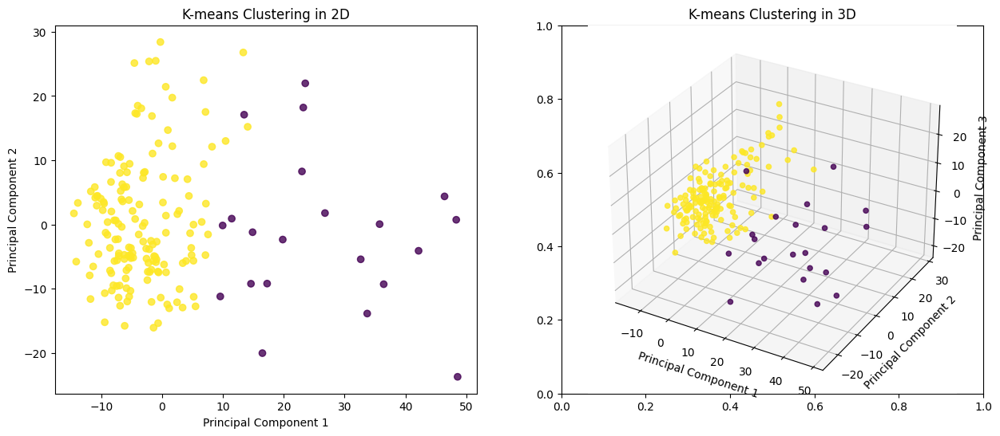

(6, 15, 79, 82)


In [ ]:
l = kmeans_plot(red_shcc, 0.8)
print(check(l, h_shcc))

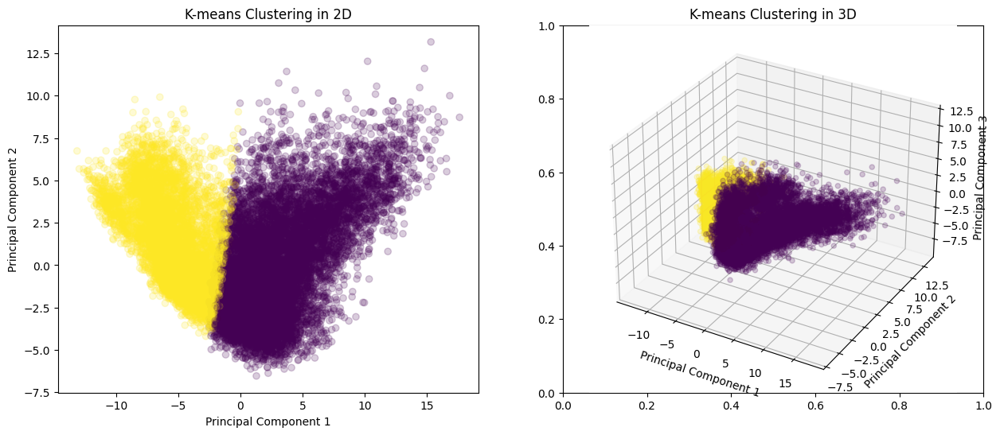

(12353, 2470, 352, 6451)


In [ ]:
l = kmeans_plot(red_dmcf, 0.2)
print(check(l, h_dmcf))

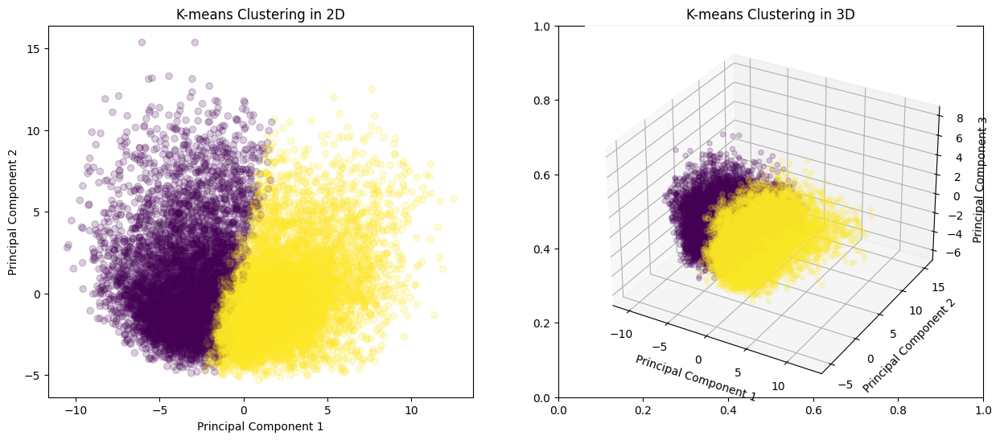

(2766, 2496, 3017, 6403)


In [ ]:
l = kmeans_plot(red_dhcc, 0.2, "elkan") #elkan is an accelerated version of the classical Kmeans algorithm
                                        #which avoids to compute all distances by using an upper bound for each point at every iteration
print(check(l, h_dhcc))

The first plot (smart_mcf) shows a satisfactory clustering and even seems to pick up the distinction between hypoxia and normoxia very well. This is consistent with the strong separability of this dataset noted during data visualization.

Unfortunately, this does not extend to the other three. Again, this confirms our impression from the visualization. Especially in the two dropseq datasets, the clustering fails completely. As a matter of fact, Kmeans optimizes on a ill-posed problem and often fails for non-convex data. Moreover, it does not scale well with the dimension of the data points.

## Hierarchical Clustering

Due to the unsuccesful analysis implementing Kmeans, we also try agglomerative clustering, using Ward's minimum variance method: it frames the choice of the pair of cluster to be merged at each iteration as an optimization problem, and is less susceptible to noise than the classical 'linkage' metrics.

In [ ]:
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram

In [ ]:
def dendogram(df, model):
  cluster = AgglomerativeClustering()
  cluster.fit(df)
  fig, ax = plt.subplots(figsize=(16, 10))
  ax.set_title(f"Dendrogram using {model} method")
  cluster = shc.linkage(df, method = model, metric = "euclidean")
  shc.dendrogram(Z = cluster)

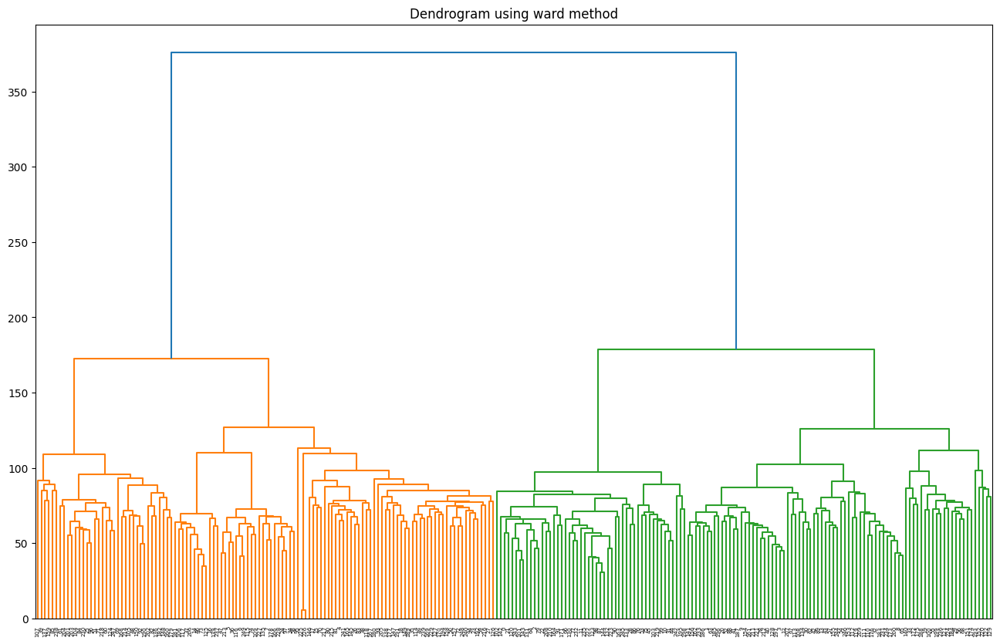

In [ ]:
dendogram(red_smcf, "ward")

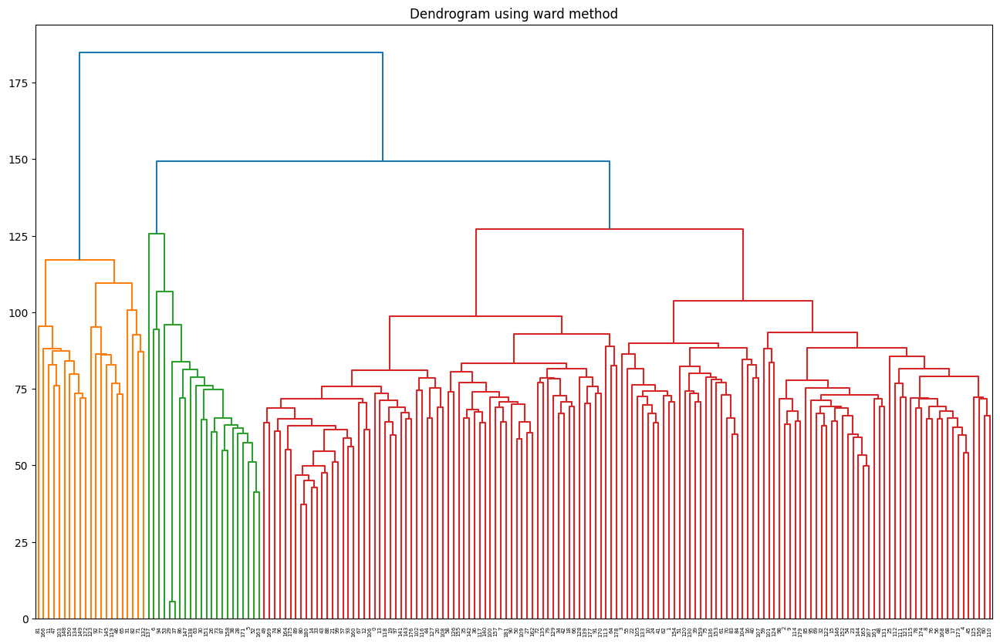

In [ ]:
dendogram(red_shcc, "ward")

Although the high time complexity did not allow us to plot the dendograms generated for dropseq dataframes, a sharp division is evident in the trees for both the smartseq dataframes.

# CLASSIFICATION


## Whole Dataset Preparation SmartSeq

In [ ]:
# ENTIRE PIPELINE FOR THE DATAFRAME

smart_hcc = pd.read_csv(project_path + '/AILab24/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt', sep=' ')
smart_hcc_meta = pd.read_csv(project_path + '/AILab24/SmartSeq/HCC1806_SmartS_MetaData.tsv', sep='\t')

smart_mcf = pd.read_csv(project_path + '/AILab24/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt', sep=' ')
smart_mcf_meta = pd.read_csv(project_path + '/AILab24/SmartSeq/MCF7_SmartS_MetaData.tsv', sep='\t')

smart_mcf_meta = smart_mcf_meta.set_index('Filename').transpose()
smart_hcc_meta = smart_hcc_meta.set_index('Filename').transpose()


cells = [cell for cell in smart_mcf_meta.columns if cell in smart_mcf.columns]
smart_mcf_df = smart_mcf[cells].transpose()
smart_mcf_df = smart_mcf_df.join(smart_mcf_meta.transpose())
smart_mcf_df["Cell_Line"] = 0 #mcf
smart_mcf_df['Condition'] = smart_mcf_df['Condition'].replace({'Hypo': 1, 'Norm': 0, 'Normo': 0}).astype(np.int16)

cells = [cell for cell in smart_hcc_meta.columns if cell in smart_hcc.columns]
smart_hcc_df = smart_hcc[cells].transpose()
smart_hcc_df = smart_hcc_df.join(smart_hcc_meta.transpose())
smart_hcc_df["Cell_Line"] = 1 #hcc
smart_hcc_df['Condition'] = smart_hcc_df['Condition'].replace({'Hypo': 1, 'Norm': 0, 'Normo': 0}).astype(np.int16)

to_remove = ['Condition', 'PreprocessingTag', 'ProcessingComments', 'Cell Line', 'Hours', 'Cell name', 'Pos']
features = [i for i in smart_mcf_df.columns if (i in smart_hcc_df.columns) and (i not in to_remove)]
features.append('Condition')

temp1 = smart_mcf_df[features]
temp2 = smart_hcc_df[features]

features.remove('Condition')

df_smart = temp1.transpose().join(temp2.transpose()).transpose()

del temp1, temp2, smart_mcf_meta, smart_hcc_meta

In [ ]:
# LOG-2 TRANSFORMATION

def rescaling(df):
  df1 = df + 1
  df1_log2 = df1.apply(np.log2)
  return df1_log2

df_smart = rescaling(df_smart)
df_smart['Condition'] = df_smart['Condition'].astype(np.int16)
df_smart['Cell_Line'] = df_smart['Cell_Line'].astype(np.int16)

In [ ]:
df_smart

,CYP1B1,CYP1B1-AS1,NDRG1,DDIT4,PFKFB3,HK2,AREG,MYBL2,ADM,CDC20,...,MN1,EEF1DP3,ABAT,ZBTB39,FZD1,ZBED6CL,TSPAN33,SLC25A27,Cell_Line,Condition
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,8.426265,7.139551,0.000000,8.596190,6.247928,0.000000,0.000000,8.897845,0.000000,7.971544,...,0.000000,0.0,4.459432,2.000000,0.000000,0.000000,0.000000,0.0,0,0
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,7.044394,5.906891,1.000000,8.179909,5.426265,0.000000,9.743151,10.632086,0.000000,6.977280,...,0.000000,0.0,5.000000,0.000000,5.285402,0.000000,0.000000,0.0,0,0
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,8.823367,7.672425,0.000000,0.000000,0.000000,0.000000,0.000000,9.599913,0.000000,7.781360,...,0.000000,0.0,0.000000,5.321928,5.087463,0.000000,6.491853,0.0,0,0
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,4.807355,3.000000,0.000000,8.174926,7.748193,4.000000,7.924813,10.219169,0.000000,8.033423,...,0.000000,0.0,6.475733,1.000000,4.906891,0.000000,3.169925,0.0,0,0
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,12.506308,11.382624,9.355351,11.279030,10.647458,9.548822,8.771489,0.000000,0.000000,0.000000,...,0.000000,0.0,3.906891,0.000000,0.000000,0.000000,5.672425,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,0.000000,0.000000,6.022368,6.321928,7.845490,3.321928,7.870365,8.647458,5.357552,9.923327,...,5.169925,0.0,0.000000,4.754888,0.000000,3.000000,4.392317,0.0,1,0
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,0.000000,4.392317,3.584963,7.392317,8.927778,6.832890,5.930737,9.074141,6.794416,10.991522,...,0.000000,0.0,0.000000,5.554589,0.000000,0.000000,0.000000,0.0,1,0
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,0.000000,0.000000,9.541097,13.314442,9.379378,7.882643,0.000000,6.209453,6.066089,11.007027,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1,1
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,0.000000,0.000000,1.000000,7.900867,7.768184,0.000000,6.523562,5.459432,7.247928,11.441388,...,0.000000,0.0,0.000000,0.000000,0.000000,5.247928,0.000000,0.0,1,0


In [ ]:
# ALLOCATE 15% OF THE DATAPOINTS FOR THE VALIDATION

X_tot, y_tot = df_smart[features], df_smart['Condition']

X, X_val, y, y_val = train_test_split(X_tot, y_tot, test_size = 0.15, random_state = 11)

In [ ]:
# LOGISTIC CLASSIFIER

from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(random_state = 11)

logistic.fit(X, y)

#make prediction about the test data
predictions = logistic.predict(X_val)

#check the accuracy of the prediction wrt actual data
result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

the accuracy calculated is: 1.0
the log loss calculated is: 0.0


### **LightGBM**

In [ ]:
# LIGHTBGM

import lightgbm

lgbmc = lightgbm.LGBMClassifier(random_state=11, verbose=-1)

lgbmc.fit(X, y)
y_pred = lgbmc.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

the accuracy calculated is: 1.0
the log loss calculated is: 0.0


In [ ]:
#Check overfitting

from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings("ignore")


scores = cross_val_score(lgbmc, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')


[0.97297297 1.         1.         0.97297297 1.         0.97297297
 1.         1.         1.         0.94444444]
mean: 	 0.986 
 std: 	 0.018


In [ ]:
# OPTUNA LIGHTGBM
!pip install --quiet optuna
import optuna

In [ ]:
#definition of the Optuna objective function

def objective(trial):

    #categorical_features_indices = np.where(X.dtypes != np.float64)[0]

    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,
                                                        random_state = 11)

    param = {
        "objective": "binary",
        #"metric": "binary_error",
        "verbosity": -1,
        "seed": 1,
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 2, 512),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 0, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'learning_rate' : trial.suggest_float('learning_rate', 0.005, 0.1),
    }

    lgbmc = lightgbm.LGBMClassifier(**param, random_state = 11)

    lgbmc.fit(x_train, y_train, eval_set=[(x_test, y_test)])
    y_pred = lgbmc.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy



In [ ]:
# Run of the optimization

#warnings.filterwarnings("ignore")
optuna.logging.set_verbosity(optuna.logging.INFO)
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20, timeout=600)

print("Number of finished trials: {}".format(len(study.trials)))
print("Best trial:")
trial = study.best_trial
print("  Value: {}".format(trial.value))
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-05-17 21:18:49,324] A new study created in memory with name: no-name-0fd78871-4531-4b4b-bfa2-deb9d6376853
[I 2024-05-17 21:18:50,232] Trial 0 finished with value: 0.9864864864864865 and parameters: {'lambda_l1': 1.7188011936014414e-05, 'lambda_l2': 0.0002094520331193039, 'num_leaves': 81, 'feature_fraction': 0.617658206446448, 'bagging_fraction': 0.44263264885581344, 'bagging_freq': 0, 'min_child_samples': 33, 'learning_rate': 0.03401236064982687}. Best is trial 0 with value: 0.9864864864864865.
[I 2024-05-17 21:18:50,589] Trial 1 finished with value: 0.581081081081081 and parameters: {'lambda_l1': 0.009963665521932522, 'lambda_l2': 0.0018732973527086458, 'num_leaves': 393, 'feature_fraction': 0.8614692874300371, 'bagging_fraction': 0.18972623222797724, 'bagging_freq': 14, 'min_child_samples': 40, 'learning_rate': 0.08886675832510744}. Best is trial 0 with value: 0.9864864864864865.
[I 2024-05-17 21:18:51,420] Trial 2 finished with value: 0.9864864864864865 and parameters: {'la

Number of finished trials: 20
Best trial:
  Value: 0.9864864864864865
  Params: 
    lambda_l1: 1.7188011936014414e-05
    lambda_l2: 0.0002094520331193039
    num_leaves: 81
    feature_fraction: 0.617658206446448
    bagging_fraction: 0.44263264885581344
    bagging_freq: 0
    min_child_samples: 33
    learning_rate: 0.03401236064982687


In [ ]:
# Best value: 1 [10 trials, 10 seconds running]

In [ ]:
# TUNED LIGHTGBM

best_model = lightgbm.LGBMClassifier(**trial.params, verbosity = -1)

best_model.fit(X, y)
y_pred = best_model.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")

the accuracy calculated is: 0.98462


In [ ]:
# CROSS VALIDATION ON TUNED LIGHTGBM

from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings("ignore")

result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

scores = cross_val_score(best_model, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

the accuracy calculated is: 0.98462
the log loss calculated is: 0.55452
[0.97297297 1.         1.         0.97297297 1.         0.97297297
 0.97297297 1.         1.         0.94444444]
mean: 	 0.984 
 std: 	 0.018


In [ ]:
# TRY TO MAKE OPTUNA OPTIMIZE DIRECTLY THE MEAN OF THE K-FOLD CROSS VALIDATION RESULTS

from sklearn.model_selection import KFold

def objective(a,b,c,d):

    x_train, x_test, y_train, y_test = a,b,c,d

    lgbmc.fit(x_train, y_train, eval_set=[(x_test, y_test)])
    y_pred = lgbmc.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy

def objective_cv(trial):

    param = {
        "objective": "binary",
        "verbosity": -1,
        "seed": 1,
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 2, 512),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 0, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'learning_rate' : trial.suggest_float('learning_rate', 0.005, 0.1),
    }

    lgbmc = lightgbm.LGBMClassifier(**param, random_state = 11)

    res = list()
    kf = KFold(n_splits = 3, shuffle=True)

    indeces = np.arange(0, len(X), 1)
    for train_index , test_index in kf.split(indeces):
      X_train , X_test = X.iloc[train_index,:], X.iloc[test_index,:]
      y_train , y_test = y.iloc[train_index], y.iloc[test_index]
      res.append(objective(X_train, X_test, y_train, y_test))
    return np.mean(res)


In [ ]:
# OPTUNA RUNNING FOR LIGHTGBM (WITH K-FOLD)

study = optuna.create_study(direction="maximize")
study.optimize(objective_cv, n_trials=10, timeout=600)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))


[I 2024-05-17 21:19:18,069] A new study created in memory with name: no-name-dada968a-5169-4418-8511-ad564de63e11
[I 2024-05-17 21:19:24,753] Trial 0 finished with value: 0.9864054378248701 and parameters: {'lambda_l1': 0.22679089447653067, 'lambda_l2': 9.748270150532755e-08, 'num_leaves': 355, 'feature_fraction': 0.3004858279555665, 'bagging_fraction': 0.5171490552713457, 'bagging_freq': 15, 'min_child_samples': 40, 'learning_rate': 0.029642069735333076}. Best is trial 0 with value: 0.9864054378248701.
[I 2024-05-17 21:19:29,385] Trial 1 finished with value: 0.9836731973877115 and parameters: {'lambda_l1': 0.029283825832031173, 'lambda_l2': 8.605032462253494e-05, 'num_leaves': 348, 'feature_fraction': 0.7767185121617496, 'bagging_fraction': 0.7912149088766282, 'bagging_freq': 3, 'min_child_samples': 95, 'learning_rate': 0.08449080296399754}. Best is trial 0 with value: 0.9864054378248701.
[I 2024-05-17 21:19:33,600] Trial 2 finished with value: 0.9782753565240571 and parameters: {'lam

Number of finished trials: 10
Best trial:
  Value: 0.9864054378248701
  Params: 
    lambda_l1: 0.22679089447653067
    lambda_l2: 9.748270150532755e-08
    num_leaves: 355
    feature_fraction: 0.3004858279555665
    bagging_fraction: 0.5171490552713457
    bagging_freq: 15
    min_child_samples: 40
    learning_rate: 0.029642069735333076


In [ ]:
# K-FOLD TUNED LIGHTGBM

Light = lightgbm.LGBMClassifier(**trial.params, verbosity = -1, random_state = 11)

Light.fit(X, y)
y_pred = Light.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")

the accuracy calculated is: 0.98462


In [ ]:
# CROSS VALIDATION ON VERY TUNED LIGHTGBM

from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings("ignore")

scores = cross_val_score(Light, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

[0.97297297 1.         1.         0.97297297 0.97297297 0.97297297
 0.97297297 1.         1.         0.91666667]
mean: 	 0.978 
 std: 	 0.024


### **Support Vector Machine**

In [ ]:
# SUPPORT VECTOR MACHINE

from sklearn.svm import SVC

support = SVC(degree=2, kernel='poly', random_state = 11)

support.fit(X, y)
y_pred = support.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

scores = cross_val_score(support, X_tot, y_tot, cv=12)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

the accuracy calculated is: 1.0
the log loss calculated is: 0.0
[1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         0.94444444]
mean: 	 0.995 
 std: 	 0.015


### **Perceptron**

In [ ]:
# PERCEPTRON

from sklearn.linear_model import Perceptron

perce = Perceptron(penalty='l1', random_state = 11)

perce.fit(X_tot, y_tot)
y_pred = perce.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

scores = cross_val_score(perce, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

the accuracy calculated is: 1.0
the log loss calculated is: 0.0
[0.94594595 1.         1.         0.97297297 1.         1.
 1.         1.         1.         1.        ]
mean: 	 0.992 
 std: 	 0.017


### **Logistic**

In [ ]:
# LOGISTIC CLASSIFIER

from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(random_state=11)

logistic.fit(X, y)
y_pred = logistic.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

scores = cross_val_score(perce, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

the accuracy calculated is: 1.0
the log loss calculated is: 0.0
[0.94594595 1.         1.         0.97297297 1.         1.
 1.         1.         1.         1.        ]
mean: 	 0.992 
 std: 	 0.017


### **Ensemble**

We decide not to include LGBMClassifier in the ensemble, since its performance in the SmartSeq dataframe is not satisfactory.

In [ ]:
from sklearn.ensemble import VotingClassifier

classifiers = [('svm', support), ('logistic', logistic), ('perceptron', perce)]
ensemble = VotingClassifier(classifiers, voting='hard', verbose=True)

ensemble.fit(X, y)

print(ensemble.score(X_val, y_val)*100)

scores = cross_val_score(ensemble, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

[Voting] ...................... (1 of 3) Processing svm, total=   0.1s
[Voting] ................. (2 of 3) Processing logistic, total=   0.5s
[Voting] ............... (3 of 3) Processing perceptron, total=   0.1s
100.0
[Voting] ...................... (1 of 3) Processing svm, total=   0.1s
[Voting] ................. (2 of 3) Processing logistic, total=   0.4s
[Voting] ............... (3 of 3) Processing perceptron, total=   0.2s
[Voting] ...................... (1 of 3) Processing svm, total=   0.1s
[Voting] ................. (2 of 3) Processing logistic, total=   0.5s
[Voting] ............... (3 of 3) Processing perceptron, total=   0.2s
[Voting] ...................... (1 of 3) Processing svm, total=   0.1s
[Voting] ................. (2 of 3) Processing logistic, total=   0.3s
[Voting] ............... (3 of 3) Processing perceptron, total=   0.2s
[Voting] ...................... (1 of 3) Processing svm, total=   0.1s
[Voting] ................. (2 of 3) Processing logistic, total=   0.5s


## **Try with PCA Applied SmartSeq**

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [ ]:
df_smart.shape

(432, 1210)

In [ ]:
sc = StandardScaler()

df_smart_reduced = sc.fit_transform(X=df_smart[features])


In [ ]:
pca = PCA(n_components = 0.95)
df_smart_reduced = pca.fit_transform(df_smart_reduced)


In [ ]:
print(df_smart_reduced.shape)

(432, 317)


In [ ]:
print(df_smart_reduced)

[[-9.00781774 10.75510613 -8.39976424 ...  1.79010696  0.43958418
   0.42396963]
 [-7.34541907 12.99433522  0.39999475 ...  0.49043509 -0.88860683
  -0.53101671]
 [-7.61058825 15.56258589 -5.80488092 ...  0.59951573 -0.2742822
  -0.57197562]
 ...
 [15.878282   -3.52679358  2.0832876  ... -0.0210004   0.46608899
   0.22939137]
 [16.41505823  2.72268788 -3.87036492 ...  0.57432732  1.63098572
   2.2107008 ]
 [15.86601847  3.64763633 -3.27244318 ...  0.15160139  1.48174485
  -1.61785188]]


In [ ]:
df_smart_reduced = pd.DataFrame(data=df_smart_reduced)
df_smart_reduced['Condition'] = list(df_smart['Condition'])
df_smart_reduced

,0,1,2,3,4,5,6,7,8,9,...,308,309,310,311,312,313,314,315,316,Condition
0,-9.007818,10.755106,-8.399764,5.750114,-1.859740,0.001273,1.733764,1.722580,-4.238197,-0.162087,...,-1.558982,0.096618,0.036269,2.199121,-0.657741,0.637937,1.790107,0.439584,0.423970,0
1,-7.345419,12.994335,0.399995,-2.572518,2.373797,-3.062643,-2.120558,-5.524702,0.696669,-4.593071,...,-1.137084,-0.621385,-0.133876,-0.044135,0.032953,0.865976,0.490435,-0.888607,-0.531017,0
2,-7.610588,15.562586,-5.804881,-0.792328,1.257384,1.895549,2.489900,-1.959874,-1.327337,2.994990,...,-0.478474,0.670476,1.585565,-1.574625,-0.824097,1.611940,0.599516,-0.274282,-0.571976,0
3,-7.180908,12.325535,3.232606,-3.579903,0.975252,0.103575,-0.034658,-1.898353,2.617984,-3.128118,...,-0.114245,1.697578,-0.030209,-0.916815,-0.549320,-0.411394,-1.363291,-0.214354,1.500216,0
4,-14.428588,-5.826062,5.546236,-0.769164,2.818160,-3.023273,-1.656792,-2.304802,-2.746549,-1.252289,...,-0.504165,0.147190,-0.854597,-0.973553,-0.481503,1.115069,0.116466,-0.377453,0.334080,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427,19.086700,2.012087,2.712296,-1.282667,-1.638202,0.114581,-4.976369,4.397044,1.545284,0.650507,...,0.018845,0.626145,0.202663,0.120699,-0.111225,1.288086,0.682585,1.425948,-0.825245,0
428,17.692544,3.150453,0.774581,-4.412624,-6.145910,-1.006815,-1.825683,7.690596,-3.577808,-4.289245,...,1.487318,-0.969922,-1.171603,-0.479273,0.486383,-0.014470,-0.084768,0.400472,0.524510,0
429,15.878282,-3.526794,2.083288,-0.672776,-5.644393,-4.160660,4.891203,2.151156,-0.689805,-3.912885,...,-0.809097,-1.532612,-0.531963,0.973640,1.121531,0.394339,-0.021000,0.466089,0.229391,1
430,16.415058,2.722688,-3.870365,-1.572476,1.075620,0.343276,-2.576928,0.623977,-1.712616,-1.869791,...,-0.945221,1.455831,0.586132,0.808474,-0.417664,0.665202,0.574327,1.630986,2.210701,0


In [ ]:
# ALLOCATE 15% OF THE DATAPOINTS FOR THE VALIDATION

X_tot, y_tot = df_smart_reduced[df_smart_reduced.columns[:-1]], df_smart_reduced['Condition']

X, X_val, y, y_val = train_test_split(X_tot, y_tot, test_size = 0.15, random_state = 11)

In [ ]:
# LOGISTIC CLASSIFIER

from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(random_state = 11)

logistic.fit(X, y)

#make prediction about the test data
predictions = logistic.predict(X_val)

#check mean absolute error of the prediction wrt actual data
res = accuracy_score(predictions, y_val)

print("The accuracy calculated through the accuracy_score is: "f"{res:.5}")

The accuracy calculated through the accuracy_score is: 1.0


### **LightGBM**

In [ ]:
# LIGHTBGM

import lightgbm

lgbmc = lightgbm.LGBMClassifier(random_state=11, verbose=-1)

lgbmc.fit(X, y)
y_pred = lgbmc.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")

the accuracy calculated is: 0.98462


In [ ]:
#Check overfitting

from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings("ignore")

scores = cross_val_score(lgbmc, X, y, cv=12)
scores

array([0.96774194, 1.        , 0.96774194, 0.93548387, 1.        ,
       0.93548387, 0.96774194, 0.9       , 1.        , 1.        ,
       1.        , 0.96666667])

In [ ]:
# OPTUNA LIGHTGBM

!pip install --quiet optuna

In [ ]:
import optuna

#definition of the Optuna objective function

def objective(trial):

    #categorical_features_indices = np.where(X.dtypes != np.float64)[0]

    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,
                                                        random_state = 11)

    param = {
        "objective": "binary",
        #"metric": "binary_error",
        "verbosity": -1,
        "seed": 1,
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 2, 512),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 0, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'learning_rate' : trial.suggest_float('learning_rate', 0.005, 0.1),
    }

    lgbmc = lightgbm.LGBMClassifier(**param, random_state = 11)

    lgbmc.fit(x_train, y_train, eval_set=[(x_test, y_test)])
    y_pred = lgbmc.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy



In [ ]:
# Run of the optimization

#warnings.filterwarnings("ignore")
optuna.logging.set_verbosity(optuna.logging.INFO)
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20, timeout=600)

print("Number of finished trials: {}".format(len(study.trials)))
print("Best trial:")
trial = study.best_trial
print("  Value: {}".format(trial.value))
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-05-17 21:41:39,233] A new study created in memory with name: no-name-f664304c-6d7a-49d9-abb8-0e7e705b7cf7
[I 2024-05-17 21:41:40,090] Trial 0 finished with value: 0.9864864864864865 and parameters: {'lambda_l1': 0.0003364768205871638, 'lambda_l2': 3.4041922474162903e-06, 'num_leaves': 396, 'feature_fraction': 0.614840021812435, 'bagging_fraction': 0.711850811420394, 'bagging_freq': 11, 'min_child_samples': 16, 'learning_rate': 0.025258882737318366}. Best is trial 0 with value: 0.9864864864864865.
[I 2024-05-17 21:41:40,269] Trial 1 finished with value: 0.9459459459459459 and parameters: {'lambda_l1': 0.0018200805909280695, 'lambda_l2': 0.6031536630503574, 'num_leaves': 45, 'feature_fraction': 0.9182096171547065, 'bagging_fraction': 0.15864787315936335, 'bagging_freq': 1, 'min_child_samples': 29, 'learning_rate': 0.04942049911621735}. Best is trial 0 with value: 0.9864864864864865.
[I 2024-05-17 21:41:40,646] Trial 2 finished with value: 0.972972972972973 and parameters: {'lambd

Number of finished trials: 20
Best trial:
  Value: 0.9864864864864865
  Params: 
    lambda_l1: 0.0003364768205871638
    lambda_l2: 3.4041922474162903e-06
    num_leaves: 396
    feature_fraction: 0.614840021812435
    bagging_fraction: 0.711850811420394
    bagging_freq: 11
    min_child_samples: 16
    learning_rate: 0.025258882737318366


In [ ]:
trial.params

{'num_leaves': 330,
 'feature_fraction': 0.7918887669680174,
 'bagging_fraction': 0.5886884847062366,
 'bagging_freq': 8,
 'min_child_samples': 52,
 'learning_rate': 0.07680912862758102}

In [ ]:
# Best value: 1 [10 trials, 10 seconds running]

In [ ]:
# TUNED LIGHTGBM

best_model = lightgbm.LGBMClassifier(**trial.params, verbosity = -1)

best_model.fit(X, y)
y_pred = best_model.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")

the accuracy calculated is: 0.95385


In [ ]:
# CROSS VALIDATION ON TUNED LIGHTGBM

from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings("ignore")

scores = cross_val_score(best_model, X, y, cv=12)
scores

array([0.96774194, 0.96774194, 0.93548387, 0.93548387, 0.96774194,
       0.96774194, 0.96774194, 0.9       , 0.96666667, 1.        ,
       1.        , 0.93333333])

In [ ]:
# TRY TO MAKE OPTUNA OPTIMIZE DIRECTLY THE MEAN OF THE K-FOLD CROSS VALIDATION RESULTS

from sklearn.model_selection import KFold

def objective(a,b,c,d):

    x_train, x_test, y_train, y_test = a,b,c,d

    lgbmc.fit(x_train, y_train, eval_set=[(x_test, y_test)])
    y_pred = lgbmc.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy

def objective_cv(trial):

    param = {
        "objective": "binary",
        "verbosity": -1,
        "seed": 1,
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 2, 512),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 0, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'learning_rate' : trial.suggest_float('learning_rate', 0.005, 0.1),
    }

    lgbmc = lightgbm.LGBMClassifier(**param, random_state = 11)

    res = list()
    kf = KFold(n_splits = 4, shuffle=True)

    indeces = np.arange(0, len(df_smart), 1)
    for train_index , test_index in kf.split(indeces):
      X_train , X_test = df_smart.iloc[train_index,:][features], df_smart.iloc[test_index,:][features]
      y_train , y_test = df_smart.iloc[train_index]['Condition'], df_smart.iloc[test_index]['Condition']
      res.append(objective(X_train, X_test, y_train, y_test))
    return np.mean(res)


In [ ]:
# OPTUNA RUNNING FOR LIGHTGBM (WITH K-FOLD)

#warnings.filterwarnings("ignore")
study = optuna.create_study(direction="maximize")
study.optimize(objective_cv, n_trials=10, timeout=600)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))


[I 2024-05-17 21:44:44,772] A new study created in memory with name: no-name-bd19031a-486c-4e1e-ae9f-add63ad99331
[I 2024-05-17 21:44:53,266] Trial 0 finished with value: 0.9907407407407407 and parameters: {'lambda_l1': 1.0978268813769196e-07, 'lambda_l2': 0.005912503465240527, 'num_leaves': 407, 'feature_fraction': 0.480987998282973, 'bagging_fraction': 0.7130237125811294, 'bagging_freq': 11, 'min_child_samples': 74, 'learning_rate': 0.07430533845514158}. Best is trial 0 with value: 0.9907407407407407.
[I 2024-05-17 21:44:59,808] Trial 1 finished with value: 0.9884259259259258 and parameters: {'lambda_l1': 0.0005857199409647279, 'lambda_l2': 1.7833994271325337e-08, 'num_leaves': 210, 'feature_fraction': 0.21720783381970576, 'bagging_fraction': 0.3695638826351534, 'bagging_freq': 15, 'min_child_samples': 44, 'learning_rate': 0.027241948604266694}. Best is trial 0 with value: 0.9907407407407407.
[I 2024-05-17 21:45:10,187] Trial 2 finished with value: 0.9907407407407407 and parameters: 

Number of finished trials: 10
Best trial:
  Value: 0.9907407407407407
  Params: 
    lambda_l1: 1.0978268813769196e-07
    lambda_l2: 0.005912503465240527
    num_leaves: 407
    feature_fraction: 0.480987998282973
    bagging_fraction: 0.7130237125811294
    bagging_freq: 11
    min_child_samples: 74
    learning_rate: 0.07430533845514158


In [ ]:
# TUNED LIGHTGBM


Light = lightgbm.LGBMClassifier(**trial.params, verbosity = -1)

Light.fit(X, y)
y_pred = Light.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")

the accuracy calculated is: 1.0


In [ ]:
# CROSS VALIDATION ON TUNED LIGHTGBM

from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings("ignore")

scores = cross_val_score(Light, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

### **Support Vector Machine**

In [ ]:
# SUPPORT VECTOR MACHINE (performs worse with same kernel, recupera con linear kernel)

from sklearn.svm import SVC

support = SVC(degree=3, kernel='linear', random_state = 11)

support.fit(X, y)
y_pred = support.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

scores = cross_val_score(support, X_tot, y_tot, cv=12)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

the accuracy calculated is: 1.0
the log loss calculated is: 0.0
[1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         0.94444444]
mean: 	 0.995 
 std: 	 0.015


### **Perceptron**

In [ ]:
# PERCEPTRON (slightly better (-0.02 std))

from sklearn.linear_model import Perceptron

perce = Perceptron(penalty='l1', random_state = 11)

perce.fit(X_tot, y_tot)
y_pred = perce.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

scores = cross_val_score(perce, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

the accuracy calculated is: 1.0
the log loss calculated is: 0.0
[0.97297297 1.         1.         0.97297297 1.         1.
 1.         1.         1.         0.97222222]
mean: 	 0.992 
 std: 	 0.013


### **Logistic**

In [ ]:
# LOGISTIC CLASSIFIER (slightly better (-0.04 std e basta))

from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(random_state=11)

logistic.fit(X, y)
y_pred = logistic.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
result2 = round(log_loss(y_val, y_pred), 5)

print(f"the accuracy calculated is: {result}")
print(f"the log loss calculated is: {result2}")

scores = cross_val_score(perce, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

the accuracy calculated is: 1.0
the log loss calculated is: 0.0
[0.97297297 1.         1.         0.97297297 1.         1.
 1.         1.         1.         0.97222222]
mean: 	 0.992 
 std: 	 0.013


### **Ensemble**

In [ ]:
from sklearn.ensemble import VotingClassifier

classifiers = [('svm', support), ('logistic', logistic), ('perceptron', perce)]
ensemble = VotingClassifier(classifiers, voting='hard', verbose=True)

ensemble.fit(X, y)

print(ensemble.score(X_val, y_val)*100)

scores = cross_val_score(ensemble, X, y, cv=10)
print(scores)
print(f'mean: \t {round(scores.mean(), 3)} \n std: \t {round(scores.std(), 3)}')

[Voting] ...................... (1 of 3) Processing svm, total=   0.0s
[Voting] ................. (2 of 3) Processing logistic, total=   0.1s
[Voting] ............... (3 of 3) Processing perceptron, total=   0.0s
100.0
[Voting] ...................... (1 of 3) Processing svm, total=   0.0s
[Voting] ................. (2 of 3) Processing logistic, total=   0.1s
[Voting] ............... (3 of 3) Processing perceptron, total=   0.0s
[Voting] ...................... (1 of 3) Processing svm, total=   0.1s
[Voting] ................. (2 of 3) Processing logistic, total=   0.1s
[Voting] ............... (3 of 3) Processing perceptron, total=   0.1s
[Voting] ...................... (1 of 3) Processing svm, total=   0.0s
[Voting] ................. (2 of 3) Processing logistic, total=   0.1s
[Voting] ............... (3 of 3) Processing perceptron, total=   0.1s
[Voting] ...................... (1 of 3) Processing svm, total=   0.1s
[Voting] ................. (2 of 3) Processing logistic, total=   0.1s


At the end, PCA turns out not to be very useful in improving the accuracy of the model.

## Dropseq

In [ ]:
# JOINING THE TWO FILES
drop_mcf = drop_mcf.transpose()
cond = list(drop_mcf.index)
cond_int = [1 if x[-7:] == 'Hypoxia' else 0 for x in cond]
drop_mcf["Cell_Line"] = 0 #mcf
drop_mcf['Condition'] = cond_int

drop_hcc = drop_hcc.transpose()
cond = list(drop_hcc.index)
cond_int = [1 if x[-7:] == 'Hypoxia' else 0 for x in cond]
drop_hcc["Cell_Line"] = 1 #hcc
drop_hcc['Condition'] = cond_int

features = [i for i in drop_mcf.columns if i in drop_hcc]

temp1 = drop_hcc[features]
temp2 = drop_mcf[features]

features.remove('Condition')

df_drop = temp1.transpose().join(temp2.transpose(), rsuffix = 'r_').transpose()

del temp1, temp2

In [ ]:
df_drop = rescaling(df_drop)
df_drop['Condition'] = df_drop['Condition'].astype(np.int16)
df_drop['Cell_Line'] = df_drop['Cell_Line'].astype(np.int16)

In [ ]:
df_drop

,MALAT1,MT-RNR2,NEAT1,H1-5,MT-RNR1,H4C3,MT-CO3,MT-ND4,MT-ND3,MT-CYB,...,ZBTB2,TUBD1,PPP2R5D,SUNO1,CHN1,RARG,MYO1F,TNK2,Cell_Line,Condition
AAAAAACCCGGC_Normoxia,2.000000,0.0,1.0,1.584963,0.0,1.584963,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
AAAACCGGATGC_Normoxia,2.000000,0.0,0.0,1.584963,0.0,3.321928,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
AAAACGAGCTAG_Normoxia,1.584963,0.0,0.0,2.584963,0.0,3.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
AAAACTTCCCCG_Normoxia,2.000000,0.0,0.0,1.000000,0.0,1.584963,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0
AAAAGCCTACCC_Normoxia,3.700440,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTCGCGTAGA_Hypoxia,0.000000,0.0,0.0,0.000000,0.0,3.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1
TTTTCGTCCGCT_Hypoxia,1.000000,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1
TTTTCTCCGGCT_Hypoxia,0.000000,0.0,0.0,1.000000,0.0,2.321928,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1
TTTTGTTCAAAG_Hypoxia,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1


In [ ]:
# ALLOCATE 15% OF THE DATAPOINTS FOR THE VALIDATION

X_tot, y_tot = df_drop[features], df_drop['Condition']

X, X_val, y, y_val = train_test_split(X_tot, y_tot, test_size = 0.15, random_state = 11)

In [ ]:
# ALLOCATE 80% OF THE REMANING DATAPOINTS FOR TRAINING

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 11)

### Classifiers with Raw Rescaled Data

As a first approach, we applied some classifiers directly on the raw rescaled data.
The purpose is to establish a baseline performance for each classifier without any feature selection or advanced preprocessing.
This analysis helps us understand the raw data's potential and set a benchmark for comparison with other preprocessing methods.

For each classifier we use the function GridSearchCV to select the best hyperparameters on the basis of the negative log loss averaged over a 3-fold cross validation.

In [ ]:
def parameter_selection(model, parameter_space, probability):
  """
    Prints best parameters, accuracy and negative log loss for the best model
  """
  clf = GridSearchCV(model, parameter_space, cv=3, scoring='neg_log_loss')
  clf.fit(X_train, y_train)

  model = clf.best_estimator_

  if probability:
    predictions = model.predict_proba(X_test)[:,1]
    accuracy = accuracy_score(np.round(predictions), y_test)
  else:
    predictions = model.predict(X_test)
    accuracy = accuracy_score(predictions, y_test)

  neglogloss = log_loss(y_test, predictions)
  print(f'Best parameters found: {clf.best_params_}')
  print(f'On the training dataset, the best model has {clf.best_score_} loss')
  print(f'On the testing dataset, the best model has {accuracy} accuracy and {-neglogloss} loss')

In [ ]:
# LOGISTIC CLASSIFIER

from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(solver='liblinear', max_iter=1000)
parameter_space = {
    'penalty': ['l1', 'l2'],
}

parameter_selection(model=logistic, parameter_space=parameter_space, probability=True)

Best parameters found: {'penalty': 'l1'}
On the training dataset, the best model has -0.20931154172028774 loss
On the testing dataset, the best model has 0.9168961606998218 accuracy and -0.20349834278428336 loss


In [ ]:
# SUPPORT VECTOR CLASSIFIER WITH POLYNOMIAL KERNEL WITH RAW DATA

from sklearn.svm import SVC

svm = SVC(kernel='poly', probability=True)
parameter_space = {
    'degree': [2, 3, 4, 5],
}

clf = GridSearchCV(svm, parameter_space, n_jobs=-1, cv=3, scoring='neg_log_loss')
clf.fit(X_train, y_train)

print(f'Best parameters found: {clf.best_params_}')

Best parameters found: {'degree': 2}


In [ ]:
# SUPPORT VECTOR CLASSIFIER WITH RAW DATA

from sklearn.svm import SVC

svm = SVC(probability=True)
parameter_space = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [2],
}

parameter_selection(model=svm, parameter_space=parameter_space, probability=True)

Best parameters found: {'degree': 2, 'kernel': 'rbf'}
On the training dataset, the best model has -0.14116719135611436 loss
On the testing dataset, the best model has 0.9452454236189859 accuracy and -0.14127585114808405 loss


In [ ]:
# K NEAREST NEIGHBORS WITH RAW DATA

from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
parameter_space = {
   'n_neighbors': np.arange(1, 25)
}

parameter_selection(model=knn, parameter_space=parameter_space, probability=False)

Best parameters found: {'n_neighbors': 24}
On the training dataset, the best model has -0.3374620725408724 loss
On the testing dataset, the best model has 0.8457800097197473 accuracy and -5.558651875334445 loss


In [ ]:
# PERCEPTRON WITH RAW DATA

from sklearn.linear_model import Perceptron

perc = Perceptron()
parameter_space = {
   'penalty': ['l1', 'l2']
}

parameter_selection(model=perc, parameter_space=parameter_space, probability=False)

Best parameters found: {'penalty': 'l1'}
On the training dataset, the best model has nan loss
On the testing dataset, the best model has 0.8600356390733841 accuracy and -5.044826912068236 loss


In [ ]:
 # MULTI LAYER PERCEPTRON WITH RAW DATA

from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(max_iter=100, early_stopping=True)
parameter_space = {
  'hidden_layer_sizes': [(128, 128), (64, 64), (96, 96)],
  'activation': ['tanh', 'relu'],
  'solver': ['sgd', 'adam'],
  'alpha': [0.01, 0.05, 0.1, 0.5],
}

parameter_selection(model=mlp, parameter_space=parameter_space, probability=False)

The results are as we expected from the eda and the unsupervised learning conducted on the dataset.
The logistic regressor, the perceptron and k-NN are too simple to capture the complexity of data with such high dimensionality.
On the other hand, the Support Vector Machines with Gaussian kernel is more effective due to the fact that the data is highly separable and the Multi Layer Perceptron can learn the inherent patterns of the data.


We then tried an ensambling method that employs soft voting (which considers the predicted probabilities) to achieve a more robust and accurate prediction.
We choose the models for the ensamble on the basis of the results we have previously achieved.

In [26]:
# ENSEMBLE WITH 3 DIFFERENT MODELS

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier

model_logistic = LogisticRegression(solver='liblinear', penalty='l1', max_iter=1000)
model_svm = SVC(probability=True)
model_mlp = MLPClassifier(max_iter=200, hidden_layer_sizes=(128, 128), alpha=0.1, early_stopping=True)

classifiers = [('logistic', model_logistic), ('svm', model_svm), ('mlp', model_mlp)]
ensemble = VotingClassifier(classifiers, voting='soft')

ensemble.fit(X_train, y_train)
print(ensemble.score(X_test, y_test)*100)

94.78105205177637


The ensemble does not improve the performance of the models, but by construction it will lower the variance in the results.

Even though we had expected the models to overfit because of the dimension of the dataset, we have achieved excellent results. The models perform and generalize well to the unseen data.

### Classifiers with Most Important Features

As a second approach, we will use Extra Trees to fetch the most important genes. The goal is to improve model performance by removing noisy or irrelevant features, thus enhancing the model's focus on the most informative aspects of the data.

We will then plot the efficiency of each classifier over the number of features selected.
We will limit our analysis on the 200 most important features because of running time considerations.

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

clf = ExtraTreesClassifier(n_estimators=5000, n_jobs=-1, bootstrap=True, max_samples=0.8)
clf.fit(X_train, y_train)

# retrieve the importance of each feature
importance = clf.feature_importances_

# sort the features by importance
dct = {i:importance[i] for i in range(len(importance))}
sorted_values = sorted(dct.items(), key=lambda importance: importance[1], reverse=True)
important_genes = [X_train.columns[t[0]] for t in sorted_values]

In [ ]:
import seaborn as sns

def dataset_top_i_genes(i):
  """
    Returns a dataset with only the top i most important genes
  """
  features = important_genes[:i] + ['Condition']
  df = df_drop[features]
  return df

def split_test_train(df, test_size=0.2):
  """
    Returns the data splitted into training and testing sets
  """
  features = df.columns
  X, y = df[features[:-1]], df['Condition']
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = 11)
  return X_train, X_test, y_train, y_test

def plot_features(min_iter, max_iter, step, model, accuracies):
  """
    Plots the efficiency over the number of features selected
  """
  fig = plt.figure(figsize=(10, 6))
  sns.lineplot(x=np.arange(min_iter, max_iter, step), y=accuracies)
  plt.xticks(np.arange(0, max_iter, step))
  plt.yticks(np.arange(0.75, 1, 0.01))
  plt.ylabel('Accuracies')
  plt.title(f'Accuracies for {model}')
  plt.xlabel('Number of features in the dataset')
  plt.grid(visible=True, which='both')


best_numbers = [] # we will store here the best features * accuracy for each classifier

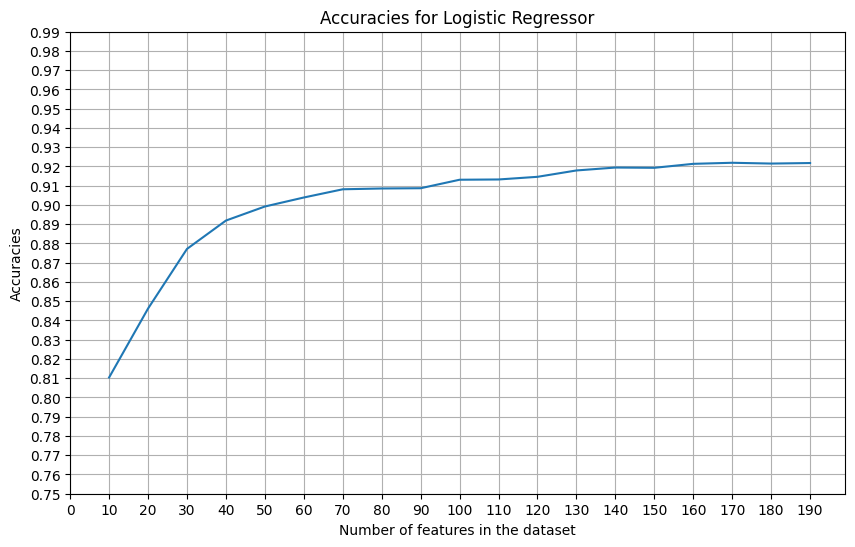

In [ ]:
# LOGISTIC CLASSIFIER

from sklearn.linear_model import LogisticRegression

min_iter = 10
max_iter = 200
step = 10
accuracies = []

best_accuracy = 0  # to store the highest accuracy
best_i = None  # to store the number of features that yields the highest accuracy
for i in range(min_iter, max_iter, step):
  df_i = dataset_top_i_genes(i)
  X_train, X_test, y_train, y_test = split_test_train(df_i)

  model_logistic = LogisticRegression(solver='liblinear', penalty='l1', max_iter=1000)
  model_logistic.fit(X_train, y_train)
  predictions = model_logistic.predict_proba(X_test)[:,1]
  accuracy = accuracy_score(np.round(predictions), y_test)
  neglogloss = log_loss(y_test, predictions)
  accuracies.append(accuracy)

  if accuracy > best_accuracy:
    best_accuracy = accuracy
    best_i = i

best_numbers.append(best_i * best_accuracy)
plot_features(min_iter, max_iter, step,'Logistic Regressor', accuracies)

On the testing dataset with 10 features, the model has 0.8394381713026714 accuracy and -0.35862000652078446 loss
On the testing dataset with 20 features, the model has 0.8811622142660425 accuracy and -0.26715193673147203 loss
On the testing dataset with 30 features, the model has 0.9176535389699807 accuracy and -0.20723394579397214 loss
On the testing dataset with 40 features, the model has 0.9271550537042137 accuracy and -0.18054937694811138 loss
On the testing dataset with 50 features, the model has 0.933489396860369 accuracy and -0.16811035642829725 loss
On the testing dataset with 60 features, the model has 0.937620490223079 accuracy and -0.16223257756829035 loss
On the testing dataset with 70 features, the model has 0.9378958964472597 accuracy and -0.15341861065805554 loss
On the testing dataset with 80 features, the model has 0.940099146240705 accuracy and -0.15189995218605298 loss
On the testing dataset with 90 features, the model has 0.9412007711374277 accuracy and -0.147573413

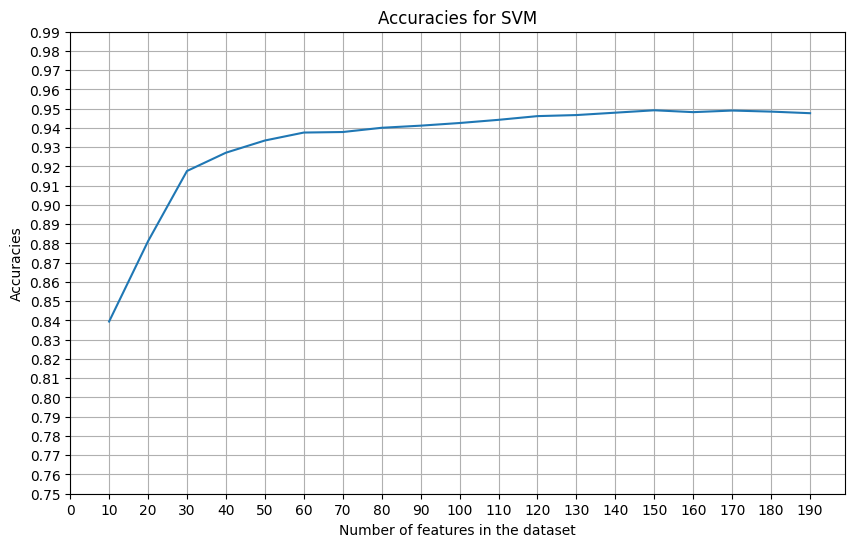

In [ ]:
# SUPPORT VECTOR CLASSIFIER

from sklearn.svm import SVC

min_iter = 10
max_iter = 200
step = 10
accuracies = []

best_accuracy = 0  # to store the highest accuracy
best_i = None  # to store the number of features that yields the highest accuracy
for i in range(min_iter, max_iter, step):
  df_i = dataset_top_i_genes(i)
  X_train, X_test, y_train, y_test = split_test_train(df_i)

  model_svm = SVC(probability=True)
  model_svm.fit(X_train, y_train)
  predictions = model_svm.predict_proba(X_test)[:,1]
  accuracy = accuracy_score(np.round(predictions), y_test)
  neglogloss = log_loss(y_test, predictions)
  accuracies.append(accuracy)
  print(f'On the testing dataset with {i} features, the model has {accuracy} accuracy and {-neglogloss} loss')

  if accuracy > best_accuracy:
    best_accuracy = accuracy
    best_i = i

best_numbers.append(best_i * best_accuracy)
plot_features(min_iter, max_iter, step,'SVM', accuracies)

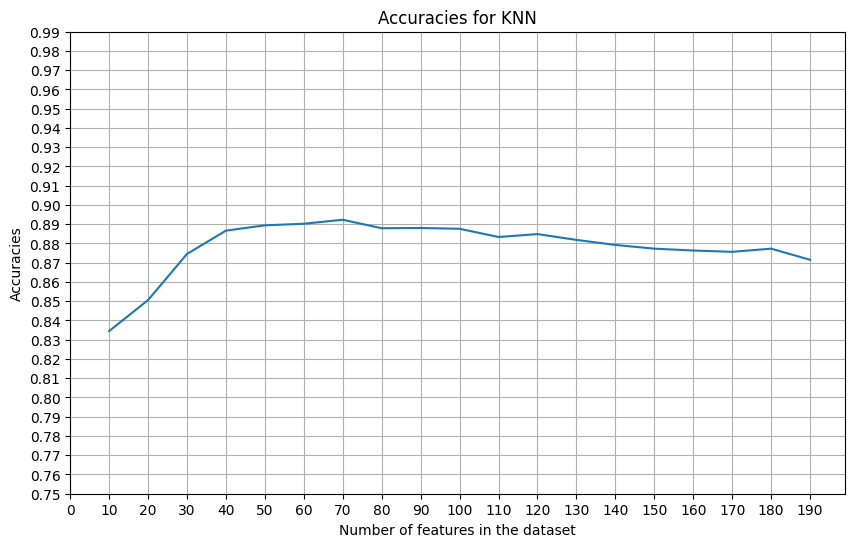

In [15]:
# K NEAREST NEIGHBORS

from sklearn.neighbors import KNeighborsClassifier

min_iter = 10
max_iter = 200
step = 10
accuracies = []

best_accuracy = 0  # to store the highest accuracy
best_i = None  # to store the number of features that yields the highest accuracy
for i in range(min_iter, max_iter, step):
  df_i = dataset_top_i_genes(i)
  X_train, X_test, y_train, y_test = split_test_train(df_i)

  max_a = 0
  neglogloss = 0
  neigh = 0
  for j in range(1, 25, 5):
    model_knn = KNeighborsClassifier(n_neighbors=j)
    model_knn.fit(X_train, y_train)
    predictions = model_knn.predict_proba(X_test)[:,1]
    accuracy = accuracy_score(np.round(predictions), y_test)
    if accuracy > max_a:
      max_a = accuracy
      neigh = j
      neglogloss = log_loss(y_test, predictions)
  accuracies.append(max_a)

  if accuracy > best_accuracy:
    best_accuracy = accuracy
    best_i = i

best_numbers.append(best_i * best_accuracy)
plot_features(min_iter, max_iter, step, 'KNN', accuracies)

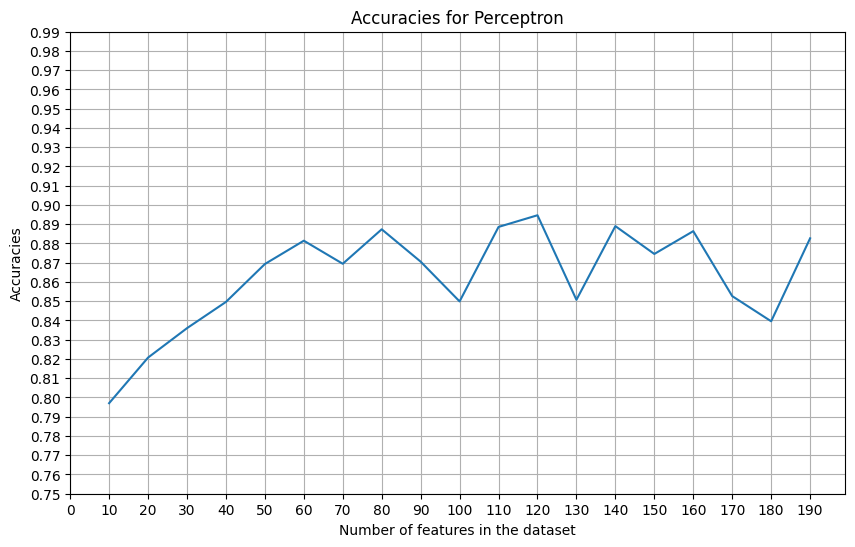

In [16]:
# PERCEPTRON

from sklearn.linear_model import Perceptron

min_iter = 10
max_iter = 200
step = 10
accuracies = []

best_accuracy = 0  # to store the highest accuracy
best_i = None  # to store the number of features that yields the highest accuracy
for i in range(min_iter, max_iter, step):
  df_i = dataset_top_i_genes(i)
  X_train, X_test, y_train, y_test = split_test_train(df_i)

  model_perc = Perceptron()
  model_perc.fit(X_train, y_train)
  predictions = model_perc.predict(X_test)
  accuracy = accuracy_score(predictions, y_test)
  neglogloss = log_loss(y_test, predictions)
  accuracies.append(accuracy)

  if accuracy > best_accuracy:
    best_accuracy = accuracy
    best_i = i

best_numbers.append(best_i * best_accuracy)
plot_features(min_iter, max_iter, step, 'Perceptron', accuracies)

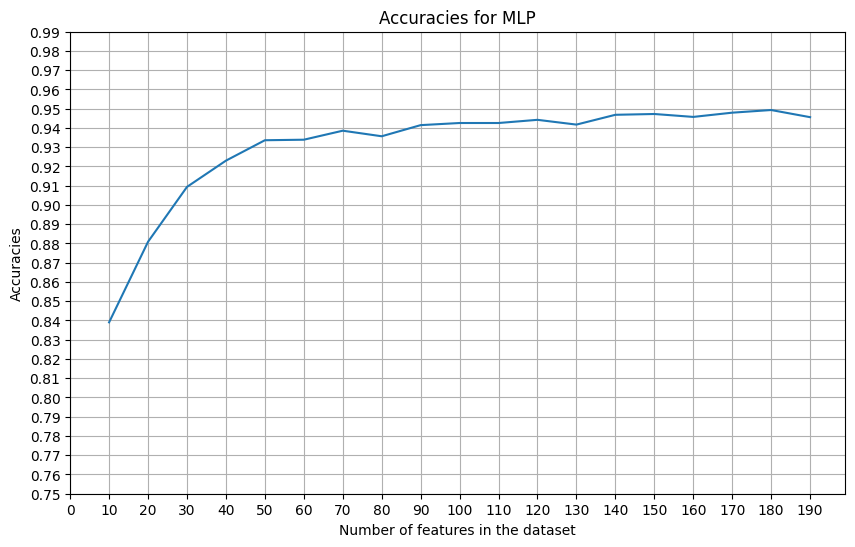

In [17]:
# MULTI LAYER PERCEPTRON

from sklearn.neural_network import MLPClassifier

min_iter = 10
max_iter = 200
step = 10
accuracies = []

best_accuracy = 0  # to store the highest accuracy
best_i = None  # to store the number of features that yields the highest accuracy
for i in range(min_iter, max_iter, step):
  df_i = dataset_top_i_genes(i)
  X_train, X_test, y_train, y_test = split_test_train(df_i)

  model_mlp = MLPClassifier(max_iter=200, hidden_layer_sizes=(64,  64), alpha=0.1, early_stopping=True)
  model_mlp.fit(X_train, y_train)
  predictions = model_mlp.predict(X_test)
  accuracy = accuracy_score(predictions, y_test)
  neglogloss = log_loss(y_test, predictions)
  accuracies.append(accuracy)

  if accuracy > best_accuracy:
    best_accuracy = accuracy
    best_i = i

best_numbers.append(best_i * best_accuracy)
plot_features(min_iter, max_iter, step, 'MLP', accuracies)

We can see an increase in the accuracy of k-NN which was expected by the decrease in dimensionality of the data.
The performance of the perceptron changes vigourously with respect to the number of features which could be explained by the lack of robustness of the model.
The best peforming models are still the logistic regressor, the support vector machine and the multi layer perceptron. This performance could again be explained by the inherent construction of the models, that allows them to work well with high-dimensional separable data.

We then do an ensemble with the 3 best performing models. The number of features will be the average of the number of best features multiplied by the accuracy of each prediction.


In [24]:
# we retrieve the best number of features averaged over the three models
best_features = int(round((best_numbers[0] + best_numbers[1] + best_numbers[4])/3, -1))
best_features

160

In [25]:
# ENSEMBLE WITH 3 DIFFERENT MODELS

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier

df = dataset_top_i_genes(best_features)
X_train, X_test, y_train, y_test = split_test_train(df)

model_svm = SVC(probability=True)
model_mlp = MLPClassifier(max_iter=200, hidden_layer_sizes=(64,  64), alpha=0.1, early_stopping=True)

classifiers = [('svm', model_svm), ('mlp', model_mlp)]
ensemble = VotingClassifier(classifiers, voting='soft')

ensemble.fit(X_train, y_train)
print(ensemble.score(X_test, y_test)*100)

95.0839988983751


This is the best performing model we have built and it could be explained by multiple factors:
1. Feature Selection: By focusing on the top 160 most important features, we reduce noise and emphasize the most informative aspects of the data.
2. Ensemble Learning: Combining multiple models (SVM, MLP, and Logistic Regression) allows the ensemble to capture diverse patterns and relationships in the data.
3. Voting Mechanism: Soft voting aggregates the predicted probabilities, offering a balanced approach.
These factors collectively enhance the model's ability to generalize and improve prediction accuracy.

The analysis on the classification with only the most important features, although it has improved on the accuracy of some classifiers, it has not given us a significant improvement in predictions.
The results also show that the majority of the features in the full dataset could be considered almost as noise towards our predictions of Normoxia and Hypoxia. By limiting the number of features through a truncation of the dataset we are indeed seeing more accurate predictions.

### Classifiers with Encoded Data


As a last approach, we preprocess the data using an autoencoder, which is a type of neural network used for unsupervised learning. The autoencoder compresses the data into a lower-dimensional representation and then reconstructs it, capturing the most salient features.
We then apply classifiers to the data transformed by the autoencoder.

This technique aims to capture complex, non-linear relationships in the data, potentially improving classification performance compared to raw or feature-selected data.


In [ ]:
import tensorflow as tf
import keras

from keras.layers import Dense, Input, Dropout
from keras import models, Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from copy import copy
import math

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))
tf.device('/device:GPU:0')

Num GPUs Available:  1
Found GPU at: /device:GPU:0


We build and train an autoencoder in order to perform dimensionality reduction (training the full autoencoder and then considering the encoder) for the joint DropSeq datasets, and cross-validate to find the best number of layers, neurons and dropout rate.

In [ ]:
def autoencoder(dimension, layers, neurons, input_size):
  input_ = Input(shape = input_size) #setting the size for the input

  last_layer = input_

  #building the encoder
  for l in range(layers):
    new = Dense(neurons, activation = 'relu')(last_layer) #implementing ReLU(dot(weight, input) + bias)
                                                          #and fully connecting the layers
    drop = Dropout(rate = 0)(new) #apply dropout to the input
    last_layer = drop
    last_layer = new

  reduced = Dense(dimension, activation = 'relu')(last_layer) #latent space
  last_layer = reduced

  #building the decoder
  for l in range(layers):
    new = Dense(neurons, activation = 'relu')(last_layer)
    drop = Dropout(rate = 0)(new)
    last_layer = drop

  output = Dense(input_size)(last_layer)

  return Model(inputs = [input_], outputs = [output]) #grouping layers into one structure

In [ ]:
def try_autoencoder(data, dimension, layers, neurons, input_size, split = 0.2):

    X_train, X_valid = train_test_split(data, test_size = split) #split the data in validation and train
    y_train, y_valid = copy(X_train), copy(X_valid)

    #in order to stop the training when the validation loss stops decreasing
    #(does not improve for 5 consecutive epochs):
    es = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 0, patience = 5)

    model = autoencoder(dimension, layers, neurons, X_train.shape[1])
    model.compile(optimizer = 'adam', loss = 'mse')

    #train the autoencoder with es
    history = model.fit(X_train, y_train, epochs = 100,
                      validation_data = (X_valid, y_valid), callbacks = [es])
    #history includes loss and validation loss for each epoch

    loss = model.evaluate(X_valid, y_valid, verbose = 0)

    return model, loss, history

In [ ]:
def cross_validation(data, dimension, split = 0.2):
    print('Parameters: Layers, Neurons, Drop Rate')

    #initialize best_loss to positive infinity to ensure any loss will be an improvement
    best_loss = math.inf

    for n_layers in [1, 3]:
        for n_neurons in [100, 300]:
            for drop_rate in [0, 0.25]:
                print('Parameters:', n_layers, n_neurons, drop_rate)
                model, loss, history = try_autoencoder(data, dimension, n_layers, n_neurons, drop_rate, split)
                if loss < best_loss:
                    best_model = model
                    best_loss = loss
                    best_params = n_layers, n_neurons, drop_rate
                    best_history = history

    print('Best Loss: ', best_loss)
    print('Best params: ', best_params)
    return best_model, best_loss, best_params, best_history

In [ ]:
best_model, best_loss, best_params, best_history = cross_validation(X_tot, dimension = 100)

print(best_model, best_loss, best_params, best_history)

Parameters: Layers, Neurons, Drop Rate
Parameters: 1 100 0
Epoch 1/100
908/908 [==============================] - 6s 4ms/step - loss: 0.0377 - val_loss: 0.0288
Epoch 2/100
908/908 [==============================] - 4s 4ms/step - loss: 0.0266 - val_loss: 0.0251
Epoch 3/100
908/908 [==============================] - 5s 5ms/step - loss: 0.0244 - val_loss: 0.0240
Epoch 4/100
908/908 [==============================] - 7s 8ms/step - loss: 0.0238 - val_loss: 0.0237
Epoch 5/100
908/908 [==============================] - 9s 10ms/step - loss: 0.0236 - val_loss: 0.0236
Epoch 6/100
908/908 [==============================] - 8s 9ms/step - loss: 0.0235 - val_loss: 0.0236
Epoch 7/100
908/908 [==============================] - 9s 10ms/step - loss: 0.0235 - val_loss: 0.0235
Epoch 8/100
908/908 [==============================] - 7s 8ms/step - loss: 0.0234 - val_loss: 0.0234
Epoch 9/100
908/908 [==============================] - 7s 8ms/step - loss: 0.0234 - val_loss: 0.0234
Epoch 10/100
908/908 [========

In [ ]:
best_params

(1, 300, 0.25)

In [ ]:
dimension = 100
n_layers = best_params[0]
n_neurons = best_params[1]
drop_rate = best_params[2]
split = 0.2

In the context of an autoencoder, the bottleneck layer often has a specific output shape because it's where the input data gets compressed into a lower-dimensional representation. The batch size can vary, while the dimensionality of the output is 100, much smaller than the input dimension.

In [ ]:
bottleneck_index = None
for i in range(len(best_model.layers)):
    layer = best_model.layers[i]
    if layer.output_shape == (None, dimension): #if the current layer's output shape has an unspecified batch size
                                                #and a dimensionality of 100 for each sample's output
        bottleneck_index = i
        break

# Create the encoder model
encoder_layers = best_model.layers[:bottleneck_index + 1]  # Include the bottleneck layer
encoder = keras.models.Sequential(encoder_layers)

In [ ]:
encoder.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_72 (Dense)            (None, 300)               250800    
                                                                 
 dense_73 (Dense)            (None, 100)               30100     
                                                                 
Total params: 280900 (1.07 MB)
Trainable params: 280900 (1.07 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


After training the autoencoder, we will now apply it to the DropSeq dataset. We will store the results in a csv file for running time consideration.

In [ ]:
X_drop_reduced = encoder.predict(X_tot)
df_X_drop_reduced = pd.DataFrame(X_drop_reduced)
y_tot_values = y_tot.tolist()
df_X_drop_reduced['Condition'] = y_tot_values
df_X_drop_reduced.to_csv(project_path + '/AILab24/DropSeq/DropSeq_Reduced_Data.csv', index=False)

1135/1135 [==============================] - 2s 1ms/step


In [ ]:
drop_reduced = pd.read_csv(project_path + '/AILab24/DropSeq/DropSeq_Reduced_Data.csv')
drop_reduced

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,Condition
0,0.0,1.638379,0.0,0.0,0.548761,0.0,0.0,0.0,0.433907,0.406607,...,1.447612,0.0,0.0,0.664493,0.0,0.0,0.565835,0.0,0.0,0
1,0.0,1.334782,0.0,0.0,1.237847,0.0,0.0,0.0,0.961285,0.489947,...,0.851549,0.0,0.0,1.201550,0.0,0.0,1.075554,0.0,0.0,0
2,0.0,1.133200,0.0,0.0,1.267240,0.0,0.0,0.0,1.015378,0.361893,...,0.827653,0.0,0.0,1.026019,0.0,0.0,0.519407,0.0,0.0,0
3,0.0,1.392008,0.0,0.0,0.634432,0.0,0.0,0.0,0.749250,0.821322,...,0.966087,0.0,0.0,0.460924,0.0,0.0,0.495881,0.0,0.0,0
4,0.0,0.611343,0.0,0.0,1.066593,0.0,0.0,0.0,0.971612,0.446913,...,1.166463,0.0,0.0,1.212188,0.0,0.0,0.575661,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36303,0.0,0.901857,0.0,0.0,1.104219,0.0,0.0,0.0,0.754117,0.677240,...,0.865480,0.0,0.0,0.435149,0.0,0.0,0.995957,0.0,0.0,1
36304,0.0,0.698970,0.0,0.0,0.404418,0.0,0.0,0.0,1.082656,0.496295,...,0.884735,0.0,0.0,0.576920,0.0,0.0,0.475186,0.0,0.0,1
36305,0.0,0.622064,0.0,0.0,0.728703,0.0,0.0,0.0,1.173623,0.348445,...,1.037847,0.0,0.0,1.429770,0.0,0.0,0.971382,0.0,0.0,1
36306,0.0,0.847591,0.0,0.0,1.058993,0.0,0.0,0.0,1.022466,0.348516,...,0.276325,0.0,0.0,0.617225,0.0,0.0,0.856518,0.0,0.0,1


In [ ]:
# ALLOCATE 80% OF THE DATAPOINTS FOR TRAINING

X_red, y_red = drop_reduced[drop_reduced.columns[:-1]], drop_reduced['Condition']

X_train_red, X_test_red, y_train_red, y_test_red = train_test_split(X_red, y_red, test_size = 0.2, random_state = 11)
# print(np.shape(X_train_red), np.shape(X_test_red), np.shape(y_train_red), np.shape(y_test_red))

(29046, 100) (7262, 100) (29046,) (7262,)


We can now apply the classifiers on the encoded data.

In [ ]:
def parameter_selection_red(model, parameter_space, probability):
  clf = GridSearchCV(model, parameter_space, cv=3, scoring='neg_log_loss')
  clf.fit(X_train_red, y_train_red)

  model = clf.best_estimator_

  if probability:
    predictions = model.predict_proba(X_test_red)[:,1]
    accuracy = accuracy_score(np.round(predictions), y_test_red)
  else:
    predictions = model.predict(X_test_red)
    accuracy = accuracy_score(predictions, y_test_red)

  neglogloss = log_loss(y_test_red, predictions)
  print(f'Best parameters found: {clf.best_params_}')
  print(f'On the training dataset, the best model has {clf.best_score_} loss')
  print(f'On the testing dataset, the best model has {accuracy} accuracy and {-neglogloss} loss')

In [ ]:
# LOGISTIC CLASSIFIER

from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(solver='liblinear', max_iter=1000)
parameter_space = {
    'penalty': ['l1', 'l2'],
}

parameter_selection_red(model=logistic, parameter_space=parameter_space, probability=True)

Best parameters found: {'penalty': 'l1'}
On the training dataset, the best model has -0.3021023108806726 loss
On the testing dataset, the best model has 0.8779950426879648 accuracy and -0.28962359790725845 loss


In [ ]:
# SUPPORT VECTOR CLASSIFIER

from sklearn.svm import SVC

model_svc = SVC(probability=True)
model_svc.fit(X_train_red, y_train_red)
classifier_prediction = model_svc.predict(X_test_red)
print(accuracy_score(y_test_red, classifier_prediction)*100)

91.3660148719361


In [ ]:
# K NEAREST NEIGHBORS

from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
parameter_space = {
   'n_neighbors': np.arange(1, 25)
}

parameter_selection_red(model=knn, parameter_space=parameter_space, probability=False)

Best parameters found: {'n_neighbors': 23}
On the training dataset, the best model has -0.3545783212823592 loss
On the testing dataset, the best model has 0.8594051225557697 accuracy and -5.0675530308852395 loss


In [ ]:
# PERCEPTRON WITH RAW DATA

from sklearn.linear_model import Perceptron

perc = Perceptron()
parameter_space = {
   'penalty': ['l1', 'l2']
}

parameter_selection_red(model=perc, parameter_space=parameter_space, probability=False)

Best parameters found: {'penalty': 'l1'}
On the training dataset, the best model has nan loss
On the testing dataset, the best model has 0.7993665656843845 accuracy and -7.231561964740248 loss


In [ ]:
 # MULTI LAYER PERCEPTRON

from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(max_iter=100, early_stopping=True)
parameter_space = {
  'hidden_layer_sizes': [(32, 32), (64, 64)],
  'alpha': [0.01, 0.05, 0.1, 0.5],
}

parameter_selection_red(model=mlp, parameter_space=parameter_space, probability=False)

Best parameters found: {'alpha': 0.5, 'hidden_layer_sizes': (64, 64)}
On the training dataset, the best model has -0.14130756316483054 loss
On the testing dataset, the best model has 0.9488093309573951 accuracy and -1.8450987317286602 loss


The performance of certain models has decreased significantly, specifically that of the support vector machine which had previously shown to be the best model for our classification problem.
The multi layer perceptron has still achieved a high accuracy, which was expected by its inherent capacity to learn deep patterns in the data.

This was nonetheless an interesting path to explore for our analysis.

## Full Dataset

### Merge the datasets

In [ ]:
smart_mcf = pd.read_csv(project_path + '/AILab24/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt', sep=' ')
smart_mcf_meta = pd.read_csv(project_path + '/AILab24/SmartSeq/MCF7_SmartS_MetaData.tsv', sep='\t')

In [ ]:
smart_hcc = pd.read_csv(project_path + '/AILab24/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt', sep=' ')
smart_hcc_meta = pd.read_csv(project_path + '/AILab24/SmartSeq/HCC1806_SmartS_MetaData.tsv', sep='\t')

In [ ]:
drop_mcf = pd.read_csv(project_path + '/AILab24/DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt', sep=' ')
drop_hcc = pd.read_csv(project_path + '/AILab24/DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt', sep=' ')

In [ ]:
smart_mcf_meta = smart_mcf_meta.set_index('Filename').transpose()
smart_hcc_meta = smart_hcc_meta.set_index('Filename').transpose()

In [ ]:
cells = [cell for cell in smart_mcf_meta.columns if cell in smart_mcf.columns]

#print(cells == smart_mcf.columns)
#print(len(cells) == len(smart_mcf.columns))

smart_mcf_df = smart_mcf[cells].transpose()
smart_mcf_df = smart_mcf_df.join(smart_mcf_meta.transpose())
#smart_mcf_df["Cell_Line"] = 0 #mcf
#smart_mcf_df["Sequencing"] = 0 #smart

smart_mcf_df['Condition'] = smart_mcf_df['Condition'].replace({'Hypo': 1, 'Norm': 0, 'Normo': 0}).astype(np.int16)

In [ ]:
cells = [cell for cell in smart_hcc_meta.columns if cell in smart_hcc.columns]

smart_hcc_df = smart_hcc[cells].transpose()
smart_hcc_df = smart_hcc_df.join(smart_hcc_meta.transpose())

smart_hcc_df['Condition'] = smart_hcc_df['Condition'].replace({'Hypo': 1, 'Norm': 0, 'Normo': 0}).astype(np.int16)

In [ ]:
drop_mcf = drop_mcf.transpose()

In [ ]:
cond = list(drop_mcf.index)
cond_int = [1 if x[-7:] == 'Hypoxia' else 0 for x in cond]
print(cond_int)

drop_mcf['Condition'] = cond_int

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
drop_hcc = drop_hcc.transpose()

In [ ]:
cond = list(drop_hcc.index)
cond_int = [1 if x[-7:] == 'Hypoxia' else 0 for x in cond]
print(cond_int)

drop_hcc['Condition'] = cond_int

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
features = [i for i in smart_mcf_df.columns if (i in smart_hcc_df.columns) and (i in drop_hcc) and (i in drop_mcf)]
print(len(features), features)

71 ['TPX2', 'DKK1', 'PADI2', 'TOP2A', 'MT-CYB', 'S100P', 'MKI67', 'KRT17', 'E2F1', 'MT-CO3', 'HMGB2', 'H4C3', 'MT-CO2', 'CAV1', 'KRT16', 'PGK1', 'TGM2', 'MT2A', 'MYH9', 'TMSB10', 'ATAD2', 'DSP', 'GADD45A', 'EGR1', 'ZFP36L1', 'NEAT1', 'ITPRIP', 'HSPB1', 'ZNF319', 'CDKN3', 'ANXA6', 'LGALS1', 'PLEKHG6', 'CENPF', 'AKR1C2', 'MALAT1', 'KRT13', 'FOSL1', 'SMOX', 'FTL', 'CABLES1', 'BCAR1', 'BMP1', 'MT-RNR2', 'P2RY2', 'MEGF6', 'GYS1', 'GPR153', 'CALM2', 'HAP1', 'MAP3K14', 'MT-ND5', 'H19', 'TLE2', 'PAQR8', 'DISP1', 'TTC28', 'HES1', 'GHDC', 'SYTL4', 'FBXO32', 'SESN2', 'MT-ND4', 'SYNM', 'TCHH', 'MT-RNR1', 'MICAL2', 'S100A2', 'RTL6', 'FZD1', 'Condition']


In [ ]:
temp1 = smart_mcf_df[features]
temp2 = smart_hcc_df[features]
temp3 = drop_hcc[features]
temp4 = drop_mcf[features]

In [ ]:
df = temp1.transpose().join(temp2.transpose()).transpose()
df = df.transpose().join(temp3.transpose()).transpose()
df = df.transpose().join(temp4.transpose(), rsuffix = 'r_').transpose()

In [ ]:
# Rearrange columns
names = list(df.columns)
names.remove('Condition')
names.append('Condition')
df = df[names]

In [ ]:
df

,TPX2,DKK1,PADI2,TOP2A,MT-CYB,S100P,MKI67,KRT17,E2F1,MT-CO3,...,SESN2,MT-ND4,SYNM,TCHH,MT-RNR1,MICAL2,S100A2,RTL6,FZD1,Condition
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,86,201,1,8,3129,0,156,0,37,2103,...,244,2517,0,0,368,0,0,0,0,0
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,94,725,44,27,5068,0,85,0,388,2983,...,43,3368,0,0,266,0,0,0,38,0
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,244,233,0,187,4822,0,305,0,434,2758,...,104,3872,0,0,288,0,0,0,33,0
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,167,1141,61,75,5639,2,66,0,74,2848,...,11,3983,0,10,338,30,0,19,29,0
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,0,214,0,0,559,80,0,0,0,197,...,286,3696,0,0,84,0,0,90,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTCGCGTAGA_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTCGTCCGCT_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTCTCCGGCT_Hypoxia,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTGTTCAAAG_Hypoxia,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
print(sum(1 for i in df.columns if 'MT-' in i))

7


In [ ]:
del smart_hcc, smart_hcc_df, smart_mcf, smart_mcf_df, smart_hcc_meta, smart_mcf_meta, temp1, temp2, temp3, temp4, drop_hcc, drop_mcf

we check if the final dataset is balanced

In [ ]:
print(len(df), f'Hypoxia: {sum(df["Condition"])/len(df)}', f'Normoxia: {(len(df)-sum(df["Condition"]))/len(df)}')

36740 Hypoxia: 0.4910451823625476 Normoxia: 0.5089548176374523


### Implement gene bidding technique and log2-transformation

This tecnique can be used to reduce the differences in gene expressions among different sequencing techniques. It consists in dividing each gene expression in a cell by a value that is computed as follows:

for each non-zero expression count in each cell,
we calculate the raw absolute values and divide them into B consecutive
intervals $[b_k, b_k+1]$, where $k ∈ {1, 2, ..., B}$. Each interval represents an equal portion of all expressed genes $1/B$. A new set of bin edges is computed for each cell, so the interval edges $b_k$ may vary among cells.

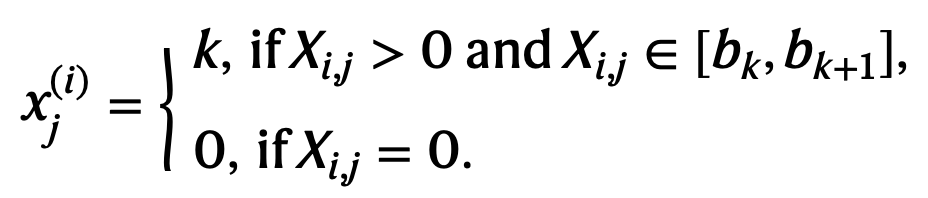

One can check this reference for more information on the topic:

[scGPT: toward building a foundation model for single-cell multi-omics using generative AI](https://https://doi.org/10.1038/s41592-024-02201-0)


In [ ]:
df1 = df.copy()
df2 = df.copy()
df3 = df.copy()

In [ ]:
#Choose number of intervals
B1 = 100
B2 = 50
B3 = 20

In [ ]:
for i in range(len(df)):
  temp1 = df1.iloc[i].max() // B1
  temp2 = df2.iloc[i].max() // B2
  temp3 = df3.iloc[i].max() // B3
  df1.iloc[i][df1.columns[0:-3:1]] = df1.iloc[i][df1.columns[0:-3:1]] // temp1
  df2.iloc[i][df2.columns[0:-3:1]] = df2.iloc[i][df2.columns[0:-3:1]] // temp2
  df3.iloc[i][df3.columns[0:-3:1]] = df3.iloc[i][df3.columns[0:-3:1]] // temp3

# running time ~4 minutes

In [ ]:
df1

,TPX2,DKK1,PADI2,TOP2A,MT-CYB,S100P,MKI67,KRT17,E2F1,MT-CO3,...,SESN2,MT-ND4,SYNM,TCHH,MT-RNR1,MICAL2,S100A2,RTL6,FZD1,Condition
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,2,4,0,0,72,0,3,0,0,48,...,5,58,0,0,8,0,0,0,0,0
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,1,13,0,0,97,0,1,0,7,57,...,0,64,0,0,5,0,0,0,38,0
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,3,3,0,2,73,0,4,0,6,41,...,1,58,0,0,4,0,0,0,33,0
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,2,18,0,1,90,0,1,0,1,45,...,0,64,0,0,5,0,0,19,29,0
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,0,1,0,0,4,0,0,0,0,1,...,2,27,0,0,0,0,0,90,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTCGCGTAGA_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTCGTCCGCT_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTCTCCGGCT_Hypoxia,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTGTTCAAAG_Hypoxia,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
df2

,TPX2,DKK1,PADI2,TOP2A,MT-CYB,S100P,MKI67,KRT17,E2F1,MT-CO3,...,SESN2,MT-ND4,SYNM,TCHH,MT-RNR1,MICAL2,S100A2,RTL6,FZD1,Condition
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,1,2,0,0,36,0,1,0,0,24,...,2,29,0,0,4,0,0,0,0,0
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,0,6,0,0,48,0,0,0,3,28,...,0,32,0,0,2,0,0,0,38,0
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,1,1,0,1,36,0,2,0,3,20,...,0,29,0,0,2,0,0,0,33,0
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,1,9,0,0,45,0,0,0,0,22,...,0,32,0,0,2,0,0,19,29,0
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,0,0,0,0,2,0,0,0,0,0,...,1,13,0,0,0,0,0,90,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTCGCGTAGA_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTCGTCCGCT_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTCTCCGGCT_Hypoxia,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTGTTCAAAG_Hypoxia,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
df3

,TPX2,DKK1,PADI2,TOP2A,MT-CYB,S100P,MKI67,KRT17,E2F1,MT-CO3,...,SESN2,MT-ND4,SYNM,TCHH,MT-RNR1,MICAL2,S100A2,RTL6,FZD1,Condition
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,0,0,0,0,14,0,0,0,0,9,...,1,11,0,0,1,0,0,0,0,0
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,0,2,0,0,19,0,0,0,1,11,...,0,12,0,0,1,0,0,0,38,0
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,0,0,0,0,14,0,0,0,1,8,...,0,11,0,0,0,0,0,0,33,0
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,0,3,0,0,18,0,0,0,0,9,...,0,12,0,0,1,0,0,19,29,0
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,0,0,0,0,0,0,0,0,0,0,...,0,5,0,0,0,0,0,90,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTCGCGTAGA_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTCGTCCGCT_Hypoxia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTCTCCGGCT_Hypoxia,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
TTTTGTTCAAAG_Hypoxia,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


We decide to proceed with B=50, which seems to be a reasonable interval that scales enough SmartSeq cells' gene expressions while preserving variation in expression in DropSeq ones.

e.g. with B=20, almost all the DropSeq genes expressions in cells amount to either 0 or 1.

In [ ]:
def rescaling(df):
  df1 = df + 1
  df1_log2 = df1.apply(np.log2)
  return df1_log2

In [ ]:
df2 = rescaling(df2)
df2['Condition'] = df2['Condition'].astype(np.int16)

### UMAP

We plot the entire dataset using UMAP, in order to have a better feel for how it looks like after the transformation.

In [ ]:
!pip install --quiet umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 6.5 MB/s eta 0:00:00


In [ ]:
import umap
um3 = umap.UMAP(n_components = 3)
um2 = umap.UMAP(n_components = 2)

In [ ]:
mapper2 = um2.fit(df2)

In [ ]:
embedded2 = um3.fit_transform(df2)

In [ ]:
!pip install datashader --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 55.7 MB/s eta 0:00:00


In [ ]:
import datashader as ds

import umap.plot

/usr/local/lib/python3.10/dist-packages/umap/plot.py:203: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(nopython=False)


<Axes: >

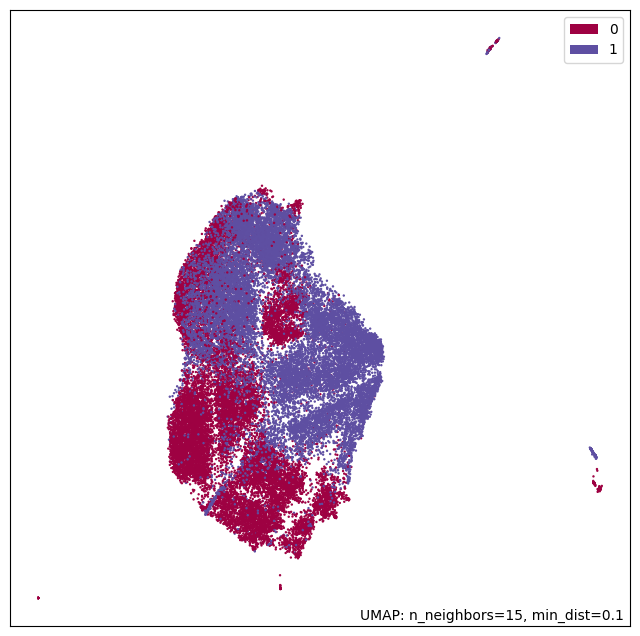

In [ ]:
umap.plot.points(mapper2, labels = df2[df2.columns[-1]])

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
x = [i[0] for i in embedded2]
y = [i[1] for i in embedded2]
z = [i[2] for i in embedded2]

Text(0.5, 0.92, 'UMAP in 3D')

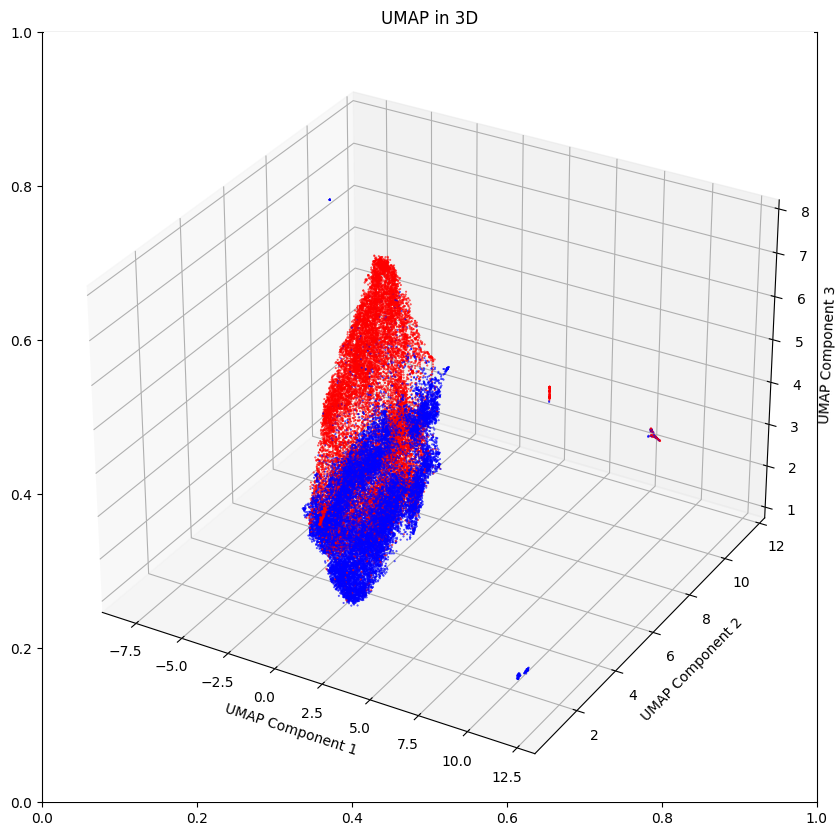

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax = fig.add_subplot(projection='3d')
ax.scatter(x,y,z, c=df2[df2.columns[-1]], cmap='bwr', alpha=0.8, s=0.2)
ax.set_xlabel('UMAP Component 1')
ax.set_ylabel('UMAP Component 2')
ax.set_zlabel('UMAP Component 3')
ax.set_title('UMAP in 3D')

### Classification of full dataset

(we do not expect a great accuracy because only 71 genes are left after the inner join of the datasets)

All the implemented models are used with the final goal of using them in an ensemble with soft voting. In practice, the single vote of a model is weighted on the conditional probability calculated. One can think of it as a weight based on the "certainty" of the model about a prediction.

For this purpose, we only used models that produce certain probabilities along with the predictions (namely: Logistic regression, Gradient Boosting, MLP, SVM)

Also, when possible, we optimized for the log loss, which is a better loss funcion to use if one wants to have a more accurate probability measure for the classification.
The explicit formula for this loss is:
$\mathscr{L}(y, p) = -(y \log(p) + (1-y) \log(1-p))$

By constructing an ensemble of classifiers the overall error might be reduced, especially if the predictions of the classifers are not intercorrelated. Regardless, the variance in the classification will surely be reduced, making the final model more generalizable and less prone to overfit.

Target accuracy: >80%

In [ ]:
# SPLIT DATA TO HAVE A VALIDATION FOR ALL MODELS
from sklearn.model_selection import train_test_split

def split_data(df, test_size=0.2):
    X, y = df[df.columns[:-1]].astype(np.int32), df['Condition'].astype(np.int16)
    return train_test_split(X, y, test_size = 0.2, random_state = 11)

In [ ]:
X, X_val, y, y_val = split_data(df2)

 **LogisticCV**

This version of logistic regression already implements cross validation and optimizes on it.

In [ ]:
# LOGISTIC CLASSIFIER
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import accuracy_score, log_loss

logistic = LogisticRegressionCV(cv=5, penalty='l2', solver='saga', n_jobs=-1, random_state=11)
logistic.fit(X, y)

y_pred = logistic.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
print(f"the accuracy calculated is: {result}")

result = round(f1_score(y_val, y_pred), 5)
print(f"the f1 score is: {result}")

result = round(mean_pinball_loss(y_val, y_pred), 5)
print(f"the quantile error is: {1-result}")

result = round(log_loss(y_val, y_pred), 5)
print(f"the log loss is: {result}")

# running time ~3 minutes

the accuracy calculated is: 0.81111
the f1 score is: 0.80384
the quantile error is: 0.90555
the log loss is: 6.80846


**LightGBM**

The following two are gradient boosting techniques. While LightGBM is faster and easier to implement, XGBoost usually provides more accurate results. We decided to use both and optimize their hyperparameters with Optuna, a library that allows the user to dynamically construct the search spaces for the hyperparameters which are to be optimized.

One can think of it as analogous to gradient descent for these parameters.

In [ ]:
!pip install --quiet optuna
import optuna
import lightgbm

In [ ]:
# TRY TO MAKE OPTUNA OPTIMIZE DIRECTLY THE MEAN OF THE K-FOLD CROSS VALIDATION RESULTS
from sklearn.metrics import f1_score, log_loss, mean_pinball_loss

from sklearn.model_selection import KFold


def objective(x_train, x_test, y_train, y_test, model):

    model.fit(x_train, y_train, eval_set=[(x_test, y_test)])
    pred_labels = model.predict(x_test)
    ll = log_loss(y_test, pred_labels)
    return ll

def objective_cv(trial):

    param = {
        "objective": "binary",
        "metric": "binary_error",
        "verbosity": -1,
        "seed": 1,
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 2, 512),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 0, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'learning_rate' : trial.suggest_float('learning_rate', 0.005, 0.1),
    }

    lgbmc = lightgbm.LGBMClassifier(**param)

    res = list()
    kf = KFold(n_splits=5, shuffle=True)
    # we shuffle the dataset so that the order of the cells is randomized and the split is more balanced.

    indeces = np.arange(0, len(X), 1)
    for train_index , test_index in kf.split(indeces):
        X_train , X_test = X.iloc[train_index,:], X.iloc[test_index,:]
        y_train , y_test = y.iloc[train_index], y.iloc[test_index]
        res.append(objective(X_train, X_test, y_train, y_test, lgbmc))

    return np.mean(res)


In [ ]:
# OPTUNA RUNNING FOR LIGHTGBM (WITH K-FOLD)

study = optuna.create_study(direction="minimize")
study.optimize(objective_cv, n_trials=20, timeout=600)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

# running time ~3 minutes

[I 2024-05-17 16:46:01,379] A new study created in memory with name: no-name-6068dd34-f844-41db-9fb4-b1c11fe0c144
[I 2024-05-17 16:46:19,041] Trial 0 finished with value: 5.7391247351181605 and parameters: {'lambda_l1': 6.175702644737556e-08, 'lambda_l2': 4.303828994098067e-07, 'num_leaves': 151, 'feature_fraction': 0.4186557342030669, 'bagging_fraction': 0.9488784338483166, 'bagging_freq': 13, 'min_child_samples': 85, 'learning_rate': 0.08432580677147361}. Best is trial 0 with value: 5.7391247351181605.
[I 2024-05-17 16:46:34,889] Trial 1 finished with value: 5.903441411441752 and parameters: {'lambda_l1': 4.288333540611693e-07, 'lambda_l2': 2.9038131946518592e-08, 'num_leaves': 128, 'feature_fraction': 0.731151652786062, 'bagging_fraction': 0.8643956831089222, 'bagging_freq': 3, 'min_child_samples': 5, 'learning_rate': 0.032490518503399256}. Best is trial 0 with value: 5.7391247351181605.
[I 2024-05-17 16:46:42,303] Trial 2 finished with value: 5.900999475437604 and parameters: {'lam

Number of finished trials: 20
Best trial:
  Value: 5.692522266014551
  Params: 
    lambda_l1: 4.2979083209532116e-05
    lambda_l2: 0.005061129869113139
    num_leaves: 106
    feature_fraction: 0.314527876829786
    bagging_fraction: 0.9893588959763491
    bagging_freq: 6
    min_child_samples: 23
    learning_rate: 0.08450402055918083


In [ ]:
# TUNED LIGHTGBM RESULTS

LGBM = lightgbm.LGBMClassifier(**trial.params, verbosity = -1)

LGBM.fit(X, y)
y_pred = LGBM.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
print(f"the accuracy calculated is: {result}")

result = round(f1_score(y_val, y_pred), 5)
print(f"the f1 score is: {result}")

result = round(mean_pinball_loss(y_val, y_pred), 5)
print(f"the quantile error is: {1-result}")

result = round(log_loss(y_val, y_pred), 5)
print(f"the log loss is: {result}")

the accuracy calculated is: 0.84173
the f1 score is: 0.8365
the quantile error is: 0.92086
the log loss is: 5.70479


**XGBoost**

In [ ]:
!pip install --quiet -U xgboost

In [ ]:
# only run if not installed in the lightGBM section
!pip install --quiet optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.8/78.8 kB 7.7 MB/s eta 0:00:00


In [ ]:
#BLIND XGBOOST

import xgboost as xgb
from sklearn.metrics import accuracy_score

n_estimators = 1000
learning_rate = 0.03
early_stopping_rounds = 10

xgmodel = xgb.XGBClassifier(n_estimators=n_estimators, learning_rate=learning_rate, reg='quantileerror')
xgmodel.fit(X, y)

y_pred = xgmodel.predict(X_val)


result = round(accuracy_score(y_val, y_pred), 5)
print(f"the accuracy calculated is: {result}")

result = round(f1_score(y_val, y_pred), 5)
print(f"the f1 score is: {result}")

result = round(mean_pinball_loss(y_val, y_pred), 5)
print(f"the quantile error is: {1-result}")

result = round(log_loss(y_val, y_pred), 5)
print(f"the log loss is: {result}")


the accuracy calculated is: 0.83819
the f1 score is: 0.83331
the quantile error is: 0.91909
the log loss is: 5.83232


In [ ]:
# Now we try to optimize it

# definition of the Optuna objective function

from sklearn.metrics import accuracy_score, log_loss, mean_pinball_loss
from sklearn.model_selection import KFold


def objective2(x_train, x_test, y_train, y_test, model):

    model.fit(x_train, y_train, eval_set=[(x_test, y_test)], verbose=0)
    pred_labels = model.predict(x_test)
    ll = log_loss(y_test, pred_labels)
    return ll


def objective_XG(trial):

    param = {
        'learning_rate' : trial.suggest_float('learning_rate', 0.05, 0.1),
        "verbosity" : 1,
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
        "depth": trial.suggest_int("depth", 1, 12),
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
        'max_depth': trial.suggest_int("max_depth", 3, 18),
        'gamma': trial.suggest_int ("gamma", 1, 9),
        'colsample_bytree' : trial.suggest_float("colsample_bytree", 0.5, 1),
        'min_child_weight' : trial.suggest_float("min_child_weight", 0, 10),
        'n_estimators': 180
    }

    xgmodel = xgb.XGBClassifier(**param, reg='quantileerror')

    res = list()
    kf = KFold(n_splits=5, shuffle=True)
    # we shuffle the dataset so that the order of the cells is randomized and the split is more balanced.

    indeces = np.arange(0, len(X), 1)
    for train_index , test_index in kf.split(indeces):
        X_train , X_test = X.iloc[train_index,:], X.iloc[test_index,:]
        y_train , y_test = y.iloc[train_index], y.iloc[test_index]
        res.append(objective2(X_train, X_test, y_train, y_test, xgmodel))

    return np.mean(res)

In [ ]:
# OPTUNA RUNNING FOR XGBOOST

study = optuna.create_study(direction="minimize")
study.optimize(objective_XG, n_trials=20, timeout=600)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

# running time ~4 minutes

[I 2024-05-17 19:49:43,432] A new study created in memory with name: no-name-bbe75d23-6eb4-4cc9-a2c7-34de43c99cda
[I 2024-05-17 19:50:01,321] Trial 0 finished with value: 5.9561902330505925 and parameters: {'learning_rate': 0.0984858209867481, 'colsample_bylevel': 0.09661266213687347, 'depth': 11, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'max_depth': 17, 'gamma': 2, 'colsample_bytree': 0.7081293897283629, 'min_child_weight': 8.974106610068077}. Best is trial 0 with value: 5.9561902330505925.
[I 2024-05-17 19:50:14,591] Trial 1 finished with value: 6.2872820015365685 and parameters: {'learning_rate': 0.07858751481378795, 'colsample_bylevel': 0.08820066588098681, 'depth': 3, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'max_depth': 17, 'gamma': 4, 'colsample_bytree': 0.5101475205819656, 'min_child_weight': 5.682952959502928}. Best is trial 0 with value: 5.9561902330505925.
[I 2024-05-17 19:50:28,213] Trial 2 finished with value: 5.979478534061284 and parameters

Number of finished trials: 20
Best trial:
  Value: 5.8678718787231965
  Params: 
    learning_rate: 0.08263912144674264
    colsample_bylevel: 0.0959290792372403
    depth: 7
    boosting_type: Ordered
    bootstrap_type: Bernoulli
    max_depth: 14
    gamma: 1
    colsample_bytree: 0.680330681487579
    min_child_weight: 8.568617895158056


In [ ]:
#TUNED XGBOOST

XGB = xgb.XGBClassifier(**trial.params)

XGB.fit(X, y)
y_pred = XGB.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
print(f"the accuracy calculated is: {result}")

result = round(f1_score(y_val, y_pred), 5)
print(f"the f1 score is: {result}")

result = round(mean_pinball_loss(y_val, y_pred), 5)
print(f"the quantile error is: {result}")

result = round(log_loss(y_val, y_pred), 5)
print(f"the log_loss error is: {result}")


the accuracy calculated is: 0.82839
the f1 score is: 0.82177
the quantile error is: 0.08581
the log_loss error is: 6.1855


Even if it seems that we got worse results when trying to optimize the model, instead we believe that the initial score we got was just fortunate, since we optimized on the K-Fold cross validation and the final result should be more similar to the actual performance that the model could obtain in a generalized setting.

**Multilayer Perceptron**

After a bit of testing that we do not include here for brevity, we decide to opt for a small and relatively simple network composed of 2 hidden layers of dimension 128.

In [ ]:
# MULTILAYER PERCEPTRON

from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

mlp = MLPClassifier(hidden_layer_sizes=(128,128), activation='relu', solver='adam',
                    alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001,
                    power_t=0.5, max_iter=40, shuffle=True, random_state=11, tol=0.001, verbose=False,
                    warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=True,
                    validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10,
                    max_fun=15000)

mlp.fit(X, y)

y_pred = mlp.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
print(f"the accuracy calculated is: {result}")

result = round(f1_score(y_val, y_pred), 5)
print(f"the f1 score is: {result}")

result = round(mean_pinball_loss(y_val, y_pred), 5)
print(f"the quantile error is: {1-result}")

result = round(log_loss(y_val, y_pred), 5)
print(f"the log loss is: {result}")

# running time ~30 seconds

the accuracy calculated is: 0.84091
the f1 score is: 0.83842
the quantile error is: 0.92045
the log loss is: 5.73422


0.8435374149659864


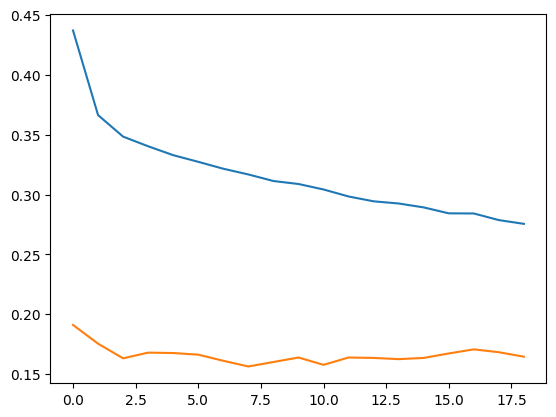

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1)
ax.plot(mlp.loss_curve_)
scores = [1-i for i in mlp.validation_scores_]
ax.plot(scores)
print(1-min(scores))

**SVM**

This is a simple Support Vector Machine implementation, with gaussian kernel. We also made it compute probabilities relative to the predictions.

In [ ]:
# SUPPORT VECTOR MACHINE

from sklearn.svm import SVC

support = SVC(kernel='rbf', probability=True)

support.fit(X, y)
y_pred = support.predict(X_val)

result = round(accuracy_score(y_val, y_pred), 5)
print(f"the accuracy calculated is: {result}")

result = round(f1_score(y_val, y_pred), 5)
print(f"the f1 score is: {result}")

result = round(mean_pinball_loss(y_val, y_pred), 5)
print(f"the quantile error is: {1-result}")

result = round(log_loss(y_val, y_pred), 5)
print(f"the log loss is: {result}")

# running time ~8 minutes

the accuracy calculated is: 0.83968
the f1 score is: 0.8352
the quantile error is: 0.91984
the log loss is: 5.77836


### Ensemble

In [ ]:
from sklearn.ensemble import VotingClassifier

classifiers = [('svm', support), ('logistic', logistic), ('mlp', mlp), ('LightGBM', LGBM), ('XGBoost', XGB)]
ensemble = VotingClassifier(classifiers, voting='soft', verbose=True)

ensemble.fit(X, y)

print(ensemble.score(X_val, y_val)*100)

# running time ~15 minutes

[Voting] ...................... (1 of 5) Processing svm, total= 8.4min
[Voting] ................. (2 of 5) Processing logistic, total= 1.6min
[Voting] ...................... (3 of 5) Processing mlp, total=  24.9s
[Voting] ................. (4 of 5) Processing LightGBM, total=   3.7s
[Voting] .................. (5 of 5) Processing XGBoost, total=   0.6s
83.92759934676103


The final accuracy of the ensemble is 83%. This satisfies our target accuracy.

# References

To answer which methods are used to reduce dimensionality:

*   Karuppiah Prakash Shyam, Venkatesan Ramya, Shaik Nadiya, Abhinav Parashar, Daniel A. Gideon, Chapter 15 - Systems biology approaches to unveiling the expression of phospholipases in various types of cancer — Transcriptomics and protein-protein interaction networks, Editor(s): Sajal Chakraborti, Phospholipases in Physiology and Pathology, Academic Press, 2023, Pages 271-307, ISBN 9780323956871, https://doi.org/10.1016/B978-0-443-15177-4.00016-9.
*   https://medium.com/@conniezhou678/understanding-linear-discriminant-analysis-lda-for-dimensionality-reduction-part-3-d1b5c664b52c

Main paper on differences between sequencing techniques:


*  Ziegenhain C, Vieth B, Parekh S, Reinius B, Guillaumet-Adkins A, Smets M, Leonhardt H, Heyn H, Hellmann I, Enard W. Comparative Analysis of Single-Cell RNA Sequencing Methods. Mol Cell. 2017 Feb 16; 65(4): 631-643.e4. doi: 10.1016/j.molcel.2017.01.023. PMID: 28212749.

